In [ ]:
pip install geohash2

  Preparing metadata (setup.py) ... done
  Created wheel for geohash2: filename=geohash2-1.1-py3-none-any.whl size=15544 sha256=0084c1349a54c60dd8f2156153c93af22fd1cf63b46344f033febba5084e6937
  Stored in directory: /root/.cache/pip/wheels/c0/21/8d/fe65503f4f439aef35193e5ec10a14adc945e20ff87eb35895
Successfully built geohash2


In [ ]:
# Data manipulation
import pandas as pd
import numpy as np
import datetime
import time

# Preprocessing
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

# Clustering & silhouette_score
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from scipy.spatial.distance import jensenshannon

# Geospatial
import geopandas as gpd
from geopandas.tools import sjoin
from shapely.geometry import Point
import geohash2

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap


# Air Quality Data

In [ ]:
data = pd.read_csv("https://raw.githubusercontent.com/IsamAljawarneh/datasets/master/data/NYC_AQ.csv")
geo_json_file = gpd.read_file('https://raw.githubusercontent.com/IsamAljawarneh/datasets/master/data/nyc_polygon.geojson')

## EDA

### Data

In [ ]:
Data = pd.read_csv('https://raw.githubusercontent.com/IsamAljawarneh/datasets/master/data/NYC_AQ.csv')

In [ ]:
Data.head()

,SensorID,time,latitude,longitude,bin0,bin1,bin2,bin3,bin4,bin5,...,bin17,bin18,bin19,bin20,bin21,bin22,bin23,temperature,humidity,pm25
0,NYCP2_CS01A,1631277304,40.847672,-73.869316,11,1,1,0,0,0,...,0,0,0,0,0,0,0,23.7,57.3,4.508813
1,NYCP2_CS01A,1631277308,40.847668,-73.869316,22,4,1,0,0,2,...,0,0,0,0,0,0,0,23.7,57.8,5.462420
2,NYCP2_CS01A,1631277313,40.847649,-73.869362,40,1,1,0,0,1,...,0,0,0,0,0,0,0,23.7,57.8,5.154881
3,NYCP2_CS01A,1631277318,40.847649,-73.869362,26,1,0,0,0,0,...,0,0,0,0,0,0,0,23.6,57.6,4.508813
4,NYCP2_CS01A,1631277323,40.847649,-73.869362,44,4,0,1,0,0,...,0,0,0,0,0,0,0,23.6,57.5,5.539503


#### Converting Unix time to DateTime

In [ ]:
Data['time'] = Data['time'].apply(datetime.datetime.fromtimestamp)

In [ ]:
Data.head()

,SensorID,time,latitude,longitude,bin0,bin1,bin2,bin3,bin4,bin5,...,bin17,bin18,bin19,bin20,bin21,bin22,bin23,temperature,humidity,pm25
0,NYCP2_CS01A,2021-09-10 12:35:04,40.847672,-73.869316,11,1,1,0,0,0,...,0,0,0,0,0,0,0,23.7,57.3,4.508813
1,NYCP2_CS01A,2021-09-10 12:35:08,40.847668,-73.869316,22,4,1,0,0,2,...,0,0,0,0,0,0,0,23.7,57.8,5.462420
2,NYCP2_CS01A,2021-09-10 12:35:13,40.847649,-73.869362,40,1,1,0,0,1,...,0,0,0,0,0,0,0,23.7,57.8,5.154881
3,NYCP2_CS01A,2021-09-10 12:35:18,40.847649,-73.869362,26,1,0,0,0,0,...,0,0,0,0,0,0,0,23.6,57.6,4.508813
4,NYCP2_CS01A,2021-09-10 12:35:23,40.847649,-73.869362,44,4,0,1,0,0,...,0,0,0,0,0,0,0,23.6,57.5,5.539503


#### Missing values

In [ ]:
Data.isnull().sum()

SensorID       0
time           0
latitude       0
longitude      0
bin0           0
bin1           0
bin2           0
bin3           0
bin4           0
bin5           0
bin6           0
bin7           0
bin8           0
bin9           0
bin10          0
bin11          0
bin12          0
bin13          0
bin14          0
bin15          0
bin16          0
bin17          0
bin18          0
bin19          0
bin20          0
bin21          0
bin22          0
bin23          0
temperature    0
humidity       0
pm25           0
dtype: int64

In [ ]:
Data.fillna({'bin12':Data['bin12'].mode()[0], 'bin13':Data['bin13'].mode()[0],'bin14':Data['bin14'].mode()[0],'bin19':Data['bin19'].mode()[0],'bin20':Data['bin20'].mode()[0],
             'bin21':Data['bin21'].mode()[0]}, inplace=True)

In [ ]:
Data.isnull().sum()

SensorID       0
time           0
latitude       0
longitude      0
bin0           0
bin1           0
bin2           0
bin3           0
bin4           0
bin5           0
bin6           0
bin7           0
bin8           0
bin9           0
bin10          0
bin11          0
bin12          0
bin13          0
bin14          0
bin15          0
bin16          0
bin17          0
bin18          0
bin19          0
bin20          0
bin21          0
bin22          0
bin23          0
temperature    0
humidity       0
pm25           0
dtype: int64

In [ ]:
len(Data)

169999

In [ ]:
Data.describe()

,time,latitude,longitude,bin0,bin1,bin2,bin3,bin4,bin5,bin6,...,bin17,bin18,bin19,bin20,bin21,bin22,bin23,temperature,humidity,pm25
count,169999,169999.000000,169999.000000,169999.000000,169999.000000,169999.000000,169999.000000,169999.000000,169999.000000,169999.000000,...,169999.000000,169999.000000,169999.000000,169999.000000,169999.000000,169999.000000,169999.000000,169999.000000,169999.000000,169999.000000
mean,2021-10-17 21:29:12.854252288,40.826202,-73.892555,78.485926,8.056747,1.885382,0.551209,0.806628,0.578003,0.367173,...,0.000247,0.000159,0.000118,0.000059,0.000065,0.000047,0.000141,17.432182,56.241018,4.310939
min,2021-09-10 12:29:09,40.711689,-73.934052,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-37.000000,0.000000,1.568473
25%,2021-09-28 05:46:52.500000,40.813564,-73.911232,16.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.400000,42.200000,3.162405
50%,2021-10-06 21:03:38,40.818981,-73.892303,39.000000,3.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.400000,55.300000,4.251249
75%,2021-11-07 06:24:49.500000,40.845383,-73.870804,92.000000,9.000000,2.000000,1.000000,1.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,22.600000,69.000000,4.786389
max,2021-12-15 14:35:55,40.904430,-73.820808,6233.000000,2493.000000,305.000000,106.000000,101.000000,92.000000,59.000000,...,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,32.400000,100.000000,12.744419
std,NaN,0.017215,0.019362,148.612154,22.639578,4.616222,1.461197,1.969984,1.535912,1.020670,...,0.016086,0.012602,0.010846,0.007669,0.008044,0.006860,0.012366,6.659859,16.583384,1.794719


### Visualization

##### Histograms

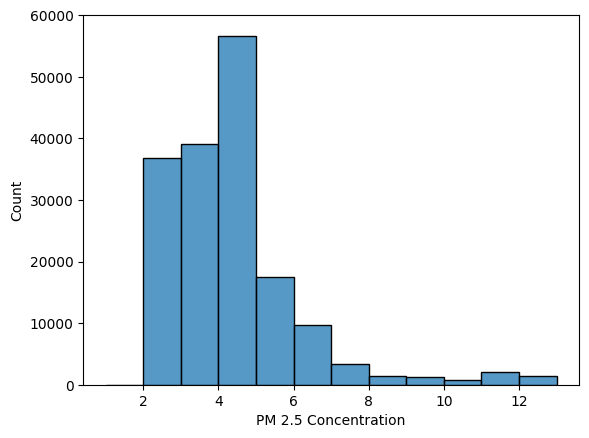

In [ ]:
sns.histplot(Data['pm25'], bins=np.arange(1,14,1));
plt.ylim(0,60001);
plt.xlabel("PM 2.5 Concentration");

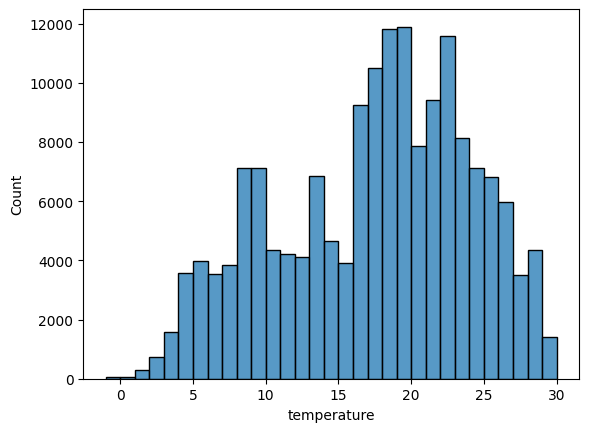

In [ ]:
sns.histplot(Data['temperature'], bins = np.arange(-1,31,1));

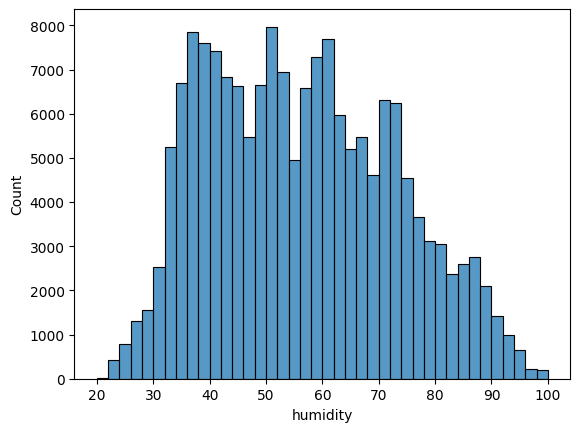

In [ ]:
sns.histplot(Data['humidity'], bins= np.arange(20,101,2));

##### Scatter Plots

###### Humidity vs PM values

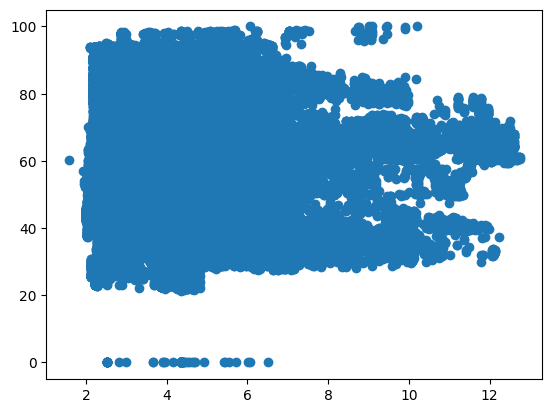

In [ ]:
plt.scatter(Data['pm25'], Data['humidity'])

###### Temperature vs PM values

<Axes: >

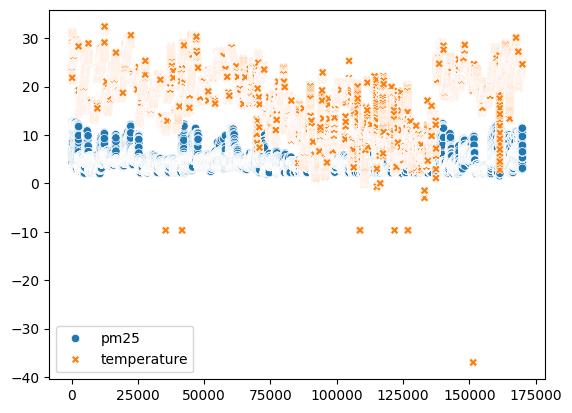

In [ ]:
sns.scatterplot([Data['pm25'], Data['temperature']])

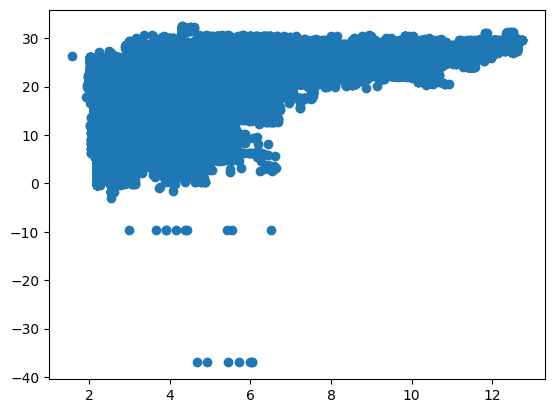

In [ ]:
plt.scatter(Data['pm25'], Data['temperature'])

##### Other plots

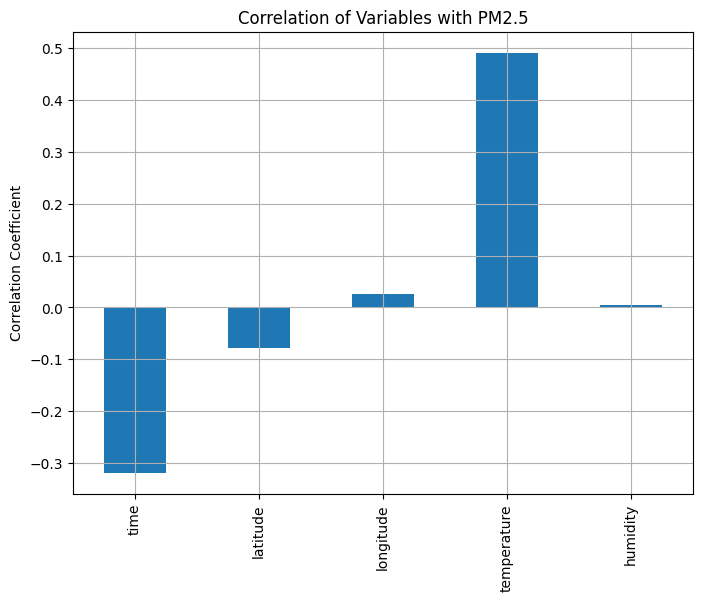

In [ ]:
columns_to_include = ['time', 'latitude', 'longitude', 'temperature', 'humidity', 'pm25']
df_selected = Data[columns_to_include]

# Calculate correlation with pm25
correlation_with_pm25 = df_selected.corr()['pm25'].drop('pm25')  # Exclude self-correlation
plt.figure(figsize=(8, 6))
correlation_with_pm25.plot(kind='bar', grid = True)
plt.title('Correlation of Variables with PM2.5')
plt.ylabel('Correlation Coefficient')
plt.grid(True)
plt.show()

##### Maps

In [ ]:
import folium
from folium.plugins import HeatMap

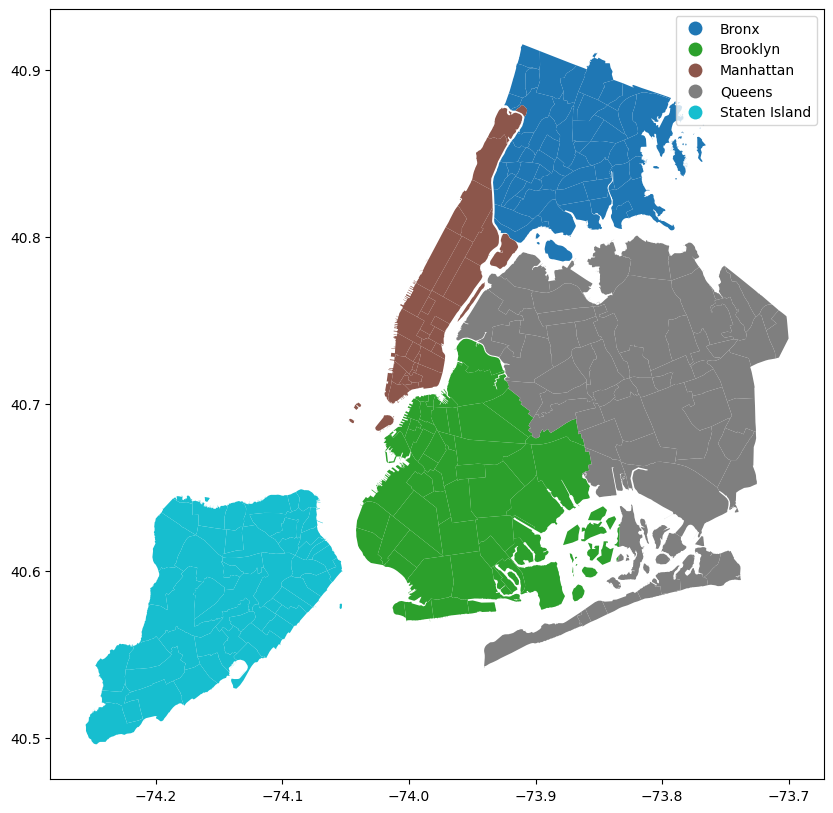

In [ ]:
sMap = geo_json_file.plot(column='borough', legend=True, figsize=(10, 10))
# plt.title('NYC Neighborhoods by Borough')
# plt.show()


In [ ]:
from geopandas.tools import sjoin

# Storing air quality data into a GeoDataFrame
gdf_air_quality = gpd.GeoDataFrame(
    Data,
    geometry=gpd.points_from_xy(Data.longitude, Data.latitude)
)

# Performing spatial join
merged_data = sjoin(gdf_air_quality, geo_json_file, how='inner', op='within')


/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3473: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):
<ipython-input-22-87944c55394d>:10: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_data = sjoin(gdf_air_quality, geo_json_file, how='inner', op='within')


In [ ]:
merged_data

,SensorID,time,latitude,longitude,bin0,bin1,bin2,bin3,bin4,bin5,...,bin23,temperature,humidity,pm25,geometry,index_right,neighborhood,boroughCode,borough,@id
0,NYCP2_CS01A,2021-09-10 12:35:04,40.847672,-73.869316,11,1,1,0,0,0,...,0,23.7,57.3,4.508813,POINT (-73.86932 40.84767),38,Bronx Park,2,Bronx,http://nyc.pediacities.com/Resource/Neighborho...
1,NYCP2_CS01A,2021-09-10 12:35:08,40.847668,-73.869316,22,4,1,0,0,2,...,0,23.7,57.8,5.462420,POINT (-73.86932 40.84767),38,Bronx Park,2,Bronx,http://nyc.pediacities.com/Resource/Neighborho...
2,NYCP2_CS01A,2021-09-10 12:35:13,40.847649,-73.869362,40,1,1,0,0,1,...,0,23.7,57.8,5.154881,POINT (-73.86936 40.84765),38,Bronx Park,2,Bronx,http://nyc.pediacities.com/Resource/Neighborho...
3,NYCP2_CS01A,2021-09-10 12:35:18,40.847649,-73.869362,26,1,0,0,0,0,...,0,23.6,57.6,4.508813,POINT (-73.86936 40.84765),38,Bronx Park,2,Bronx,http://nyc.pediacities.com/Resource/Neighborho...
4,NYCP2_CS01A,2021-09-10 12:35:23,40.847649,-73.869362,44,4,0,1,0,0,...,0,23.6,57.5,5.539503,POINT (-73.86936 40.84765),38,Bronx Park,2,Bronx,http://nyc.pediacities.com/Resource/Neighborho...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
161398,NYCP2_CS02A,2021-10-29 18:17:24,40.829147,-73.931694,2,0,0,0,0,0,...,0,15.6,63.7,3.421613,POINT (-73.93169 40.82915),131,Highbridge,2,Bronx,http://nyc.pediacities.com/Resource/Neighborho...
161454,NYCP2_CS02A,2021-11-11 22:54:17,40.858864,-73.922646,1,0,0,0,0,0,...,0,16.3,65.7,2.292276,POINT (-73.92265 40.85886),141,Inwood,1,Manhattan,http://nyc.pediacities.com/Resource/Neighborho...
161455,NYCP2_CS02A,2021-11-11 22:54:37,40.854622,-73.923546,1,0,0,0,0,0,...,0,16.0,67.1,2.367734,POINT (-73.92355 40.85462),295,Washington Heights,1,Manhattan,http://nyc.pediacities.com/Resource/Neighborho...
161459,NYCP2_CS02A,2021-11-14 01:29:46,40.839794,-73.848595,1,0,0,0,0,0,...,0,7.9,56.0,3.464629,POINT (-73.84860 40.83979),299,Westchester Square,2,Bronx,http://nyc.pediacities.com/Resource/Neighborho...


In [ ]:
len(merged_data)

169995

In [ ]:
data = merged_data

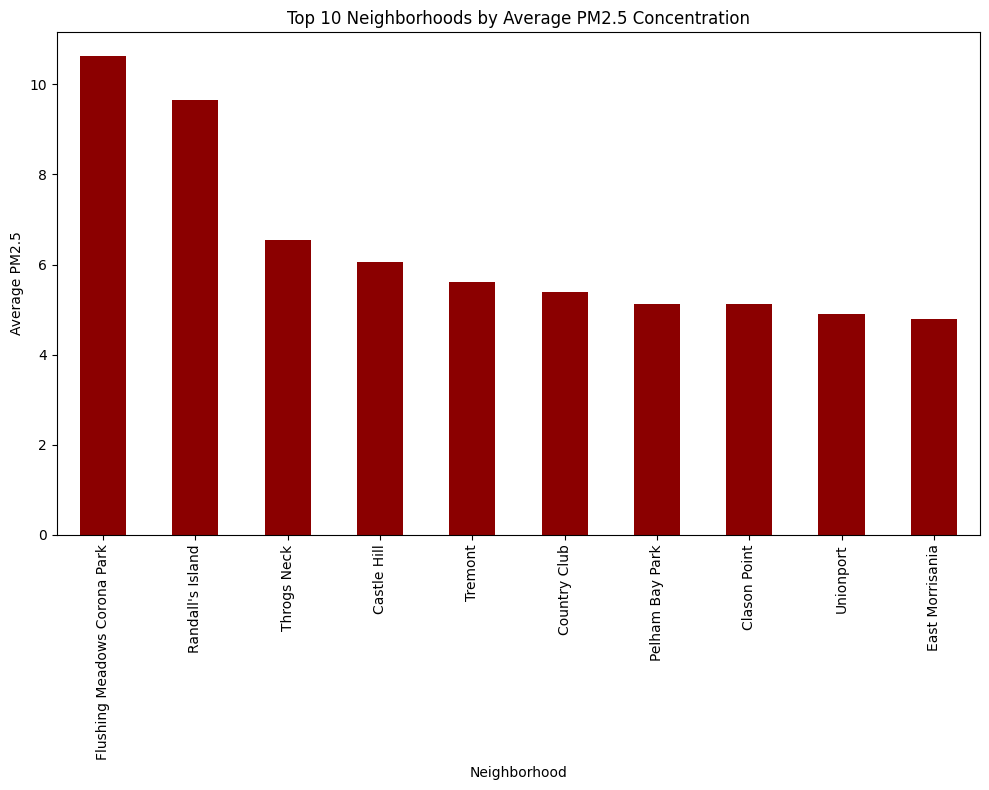

In [ ]:
mean_pm25_by_neighborhood = merged_data.groupby('neighborhood')['pm25'].mean()
top_10_pm25_by_neighborhood = mean_pm25_by_neighborhood.sort_values(ascending=False).head(10)

plt.figure(figsize=(10, 8))
top_10_pm25_by_neighborhood.plot(kind='bar', color='darkred')
plt.title('Top 10 Neighborhoods by Average PM2.5 Concentration')
plt.xlabel('Neighborhood')
plt.ylabel('Average PM2.5')
plt.tight_layout()  # Adjust layout to make room for label rotation
plt.show()

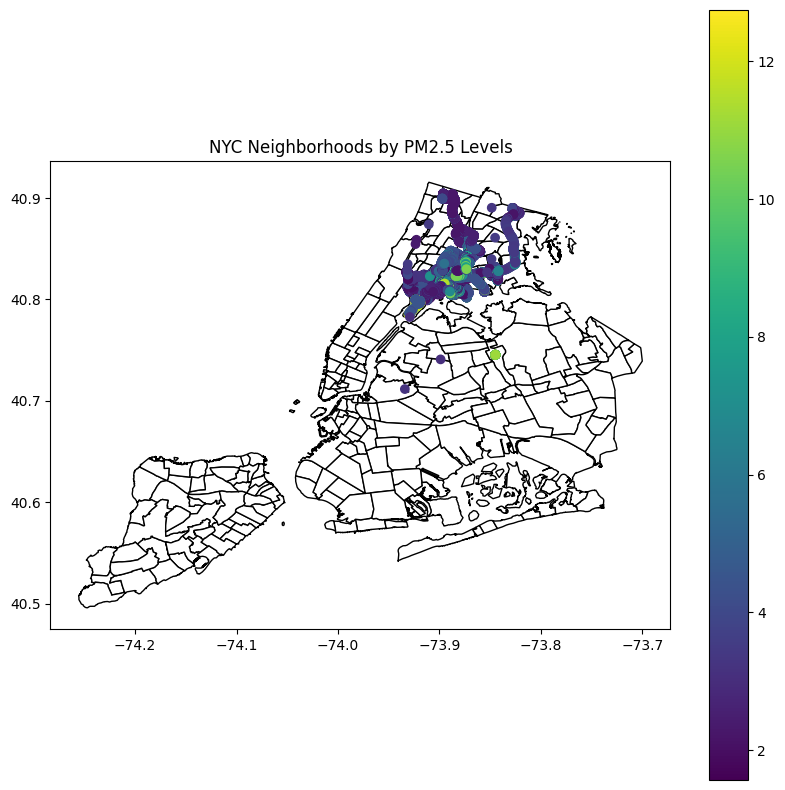

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
geo_json_file.plot(ax=ax, color='white', edgecolor='black')
merged_data.plot(column='pm25', legend=True, ax=ax)
plt.title('NYC Neighborhoods by PM2.5 Levels')
plt.show()

In [ ]:
average_latitude = merged_data['latitude'].mean()
average_longitude = merged_data['longitude'].mean()

m = folium.Map(location=[average_latitude, average_longitude], zoom_start=11)

In [ ]:
HeatMap(data=merged_data[['latitude', 'longitude', 'pm25']].dropna(), radius=25).add_to(m)

In [ ]:
m

## Task 1

**We used geohash for sampling instead of raw longitude and latitude to efficiently transform these coordinates into a categorical format that easily segments the geographic space into well-defined, manageable areas. This categorical representation simplifies grouping and stratification processes, ensuring that each sampled area is geographically representative without the complexities of handling continuous spatial data.**

In [ ]:
# Defining geohash precision
precision = 5

# Creating a geohash column based on longitude and latitude
data['geohash'] = data.apply(lambda x: geohash2.encode(x.latitude, x.longitude, precision=precision), axis=1)

In [ ]:
def sample_and_cluster(data, sampling_fraction, eps_km, min_samples):
    #start_time = time.time()  # Start timing

    # Stratified sampling
    sampled_data = data.groupby('geohash').apply(lambda x: x.sample(frac=sampling_fraction, random_state=42)).reset_index(drop=True)

    # Convert coordinates to radians for clustering
    coords = np.radians(sampled_data[['latitude', 'longitude']].values)

    # DBSCAN clustering
    kms_per_radian = 6371.0088  # Earth radius in kilometers
    epsilon = eps_km / kms_per_radian
    db = DBSCAN(eps=epsilon, min_samples=min_samples, algorithm='ball_tree', metric='haversine').fit(coords)
    sampled_data['cluster'] = db.labels_

    #end_time = time.time()  # End timing
    #training_time = end_time - start_time  # Calculate duration

    num_clusters = len(set(db.labels_)) - (1 if -1 in set(db.labels_) else 0)
    print(f'Number of clusters formed: {num_clusters}') #, Training Time: {training_time:.2f} seconds')

    return sampled_data, coords#, training_time  # Return training time as well

In [ ]:
def visualize_clusters(data):
    plt.figure(figsize=(10, 6))
    plt.scatter(data['longitude'], data['latitude'], c=data['cluster'], cmap='viridis', alpha=0.6)
    plt.colorbar()
    plt.title('DBSCAN Clustering')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.show()

In [ ]:
def calculate_silhouette(coords, labels):
    if len(np.unique(labels)) > 1:
        scaler = StandardScaler()
        scaled_coords = scaler.fit_transform(coords[labels != -1])
        return silhouette_score(scaled_coords, labels[labels != -1])
    return None

**DBSCAN Parameters:**
<br>
`eps (epsilon)`: This is the maximum distance between two samples for them to be considered as in the same neighborhood. A small eps value may lead to the data being considered as noise, and a large eps might merge distinct clusters.
<br>
`min_samples`: This is the minimum number of points required to form a dense region, which DBSCAN treats as a cluster. A lower value makes it easier to form a cluster.

In [ ]:
kms_per_radian = 6371.0088  # Earth radius in kilometers

#### `eps = 0.1` and `min_samples = 15`

In [ ]:
# Defining parameters for DBSCAN
sampling_fractions = [0.1, 0.2, 0.3]
eps_km = 0.1  # Epsilon in kilometers
min_samples = 15  # Minimum number of samples to form a cluster

Analyzing for Sampling Fraction: 0.1
Number of clusters formed: 27


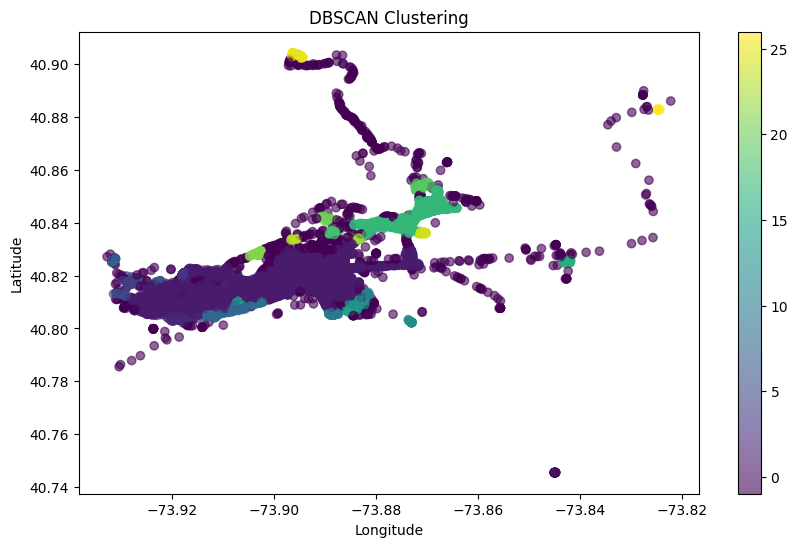

Analyzing for Sampling Fraction: 0.2
Number of clusters formed: 34


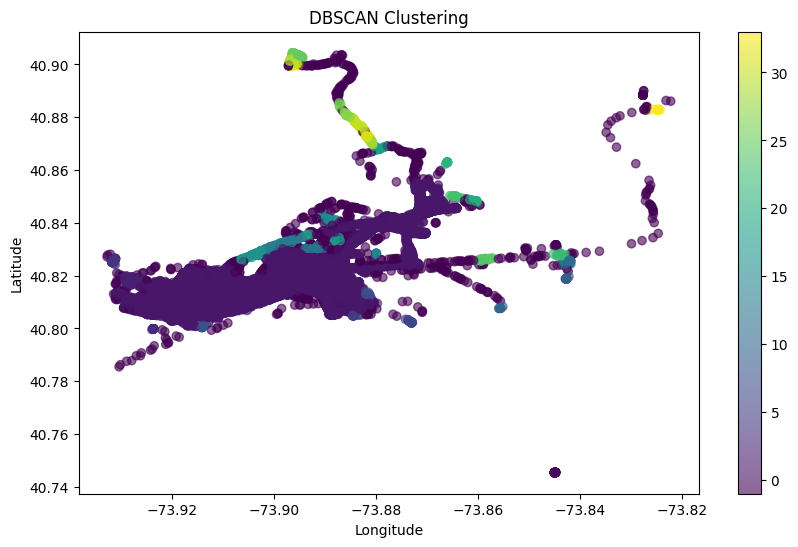

Analyzing for Sampling Fraction: 0.3
Number of clusters formed: 30


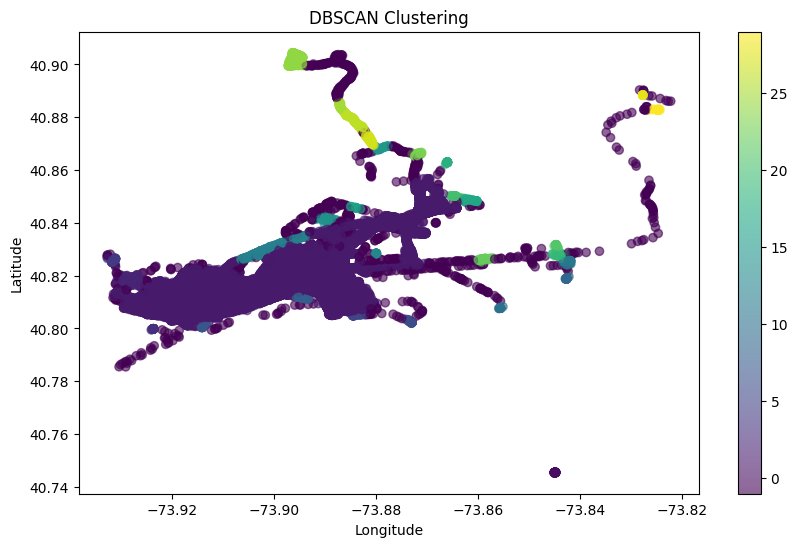

In [ ]:
coordinates_silhouette_scores1 = []
fraction_sizes = []

# Perform analysis for each sampling fraction
for fraction in sampling_fractions:
    print(f"Analyzing for Sampling Fraction: {fraction}")
    stratified_sample, coords = sample_and_cluster(data, fraction, eps_km, min_samples)
    sil_score = calculate_silhouette(coords, stratified_sample['cluster'])
    if sil_score is not None:
        coordinates_silhouette_scores1.append(sil_score)
        fraction_sizes.append(fraction)
    visualize_clusters(stratified_sample)

In [ ]:
coordinates_silhouette_scores1

[-0.042782433668426156, -0.6061133700584243, -0.6269583208355031]

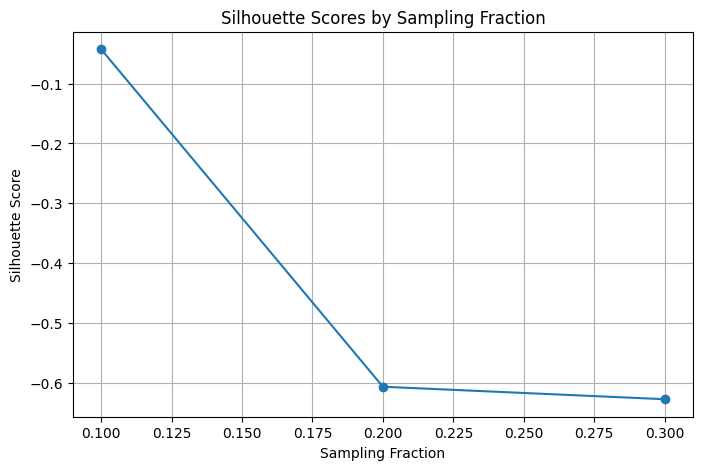

In [ ]:
# Plotting silhouette scores against sampling fractions (eps = 0.1 and min_samples = 15)
plt.figure(figsize=(8, 5))
plt.plot(fraction_sizes, coordinates_silhouette_scores1, marker='o', linestyle='-')
plt.title('Silhouette Scores by Sampling Fraction')
plt.xlabel('Sampling Fraction')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()

#### `eps = 0.5` and `min_samples = 20`

In [ ]:
# Defining parameters for DBSCAN
sampling_fractions = [0.1, 0.2, 0.3]
eps_km = 0.5  # Epsilon in kilometers
min_samples = 20  # Minimum number of samples to form a cluster

Analyzing for Sampling Fraction: 0.1
Number of clusters formed: 6


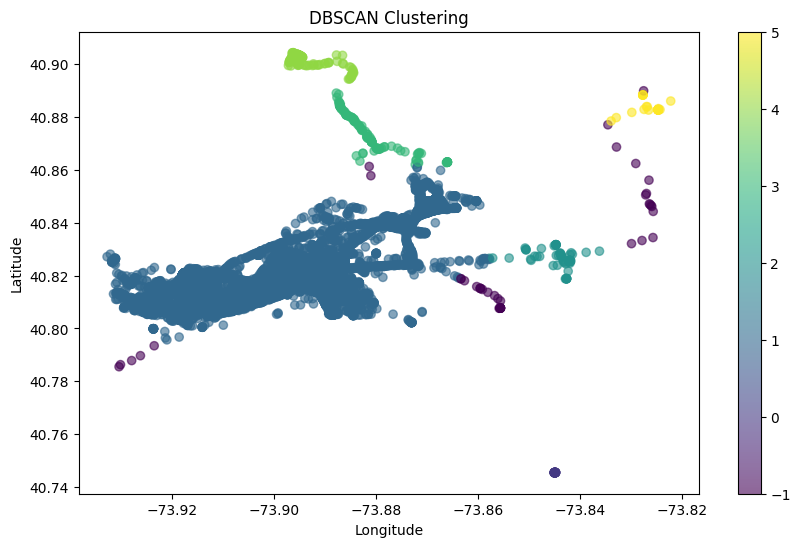

Analyzing for Sampling Fraction: 0.2
Number of clusters formed: 4


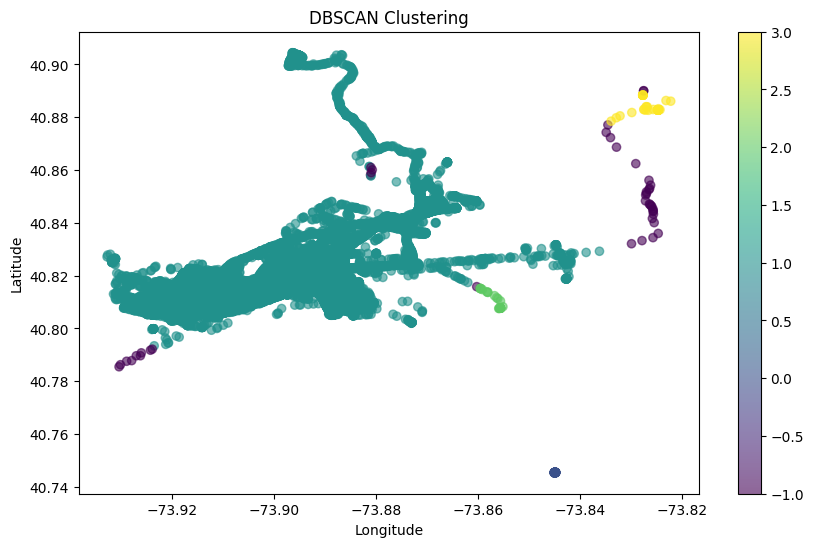

Analyzing for Sampling Fraction: 0.3
Number of clusters formed: 4


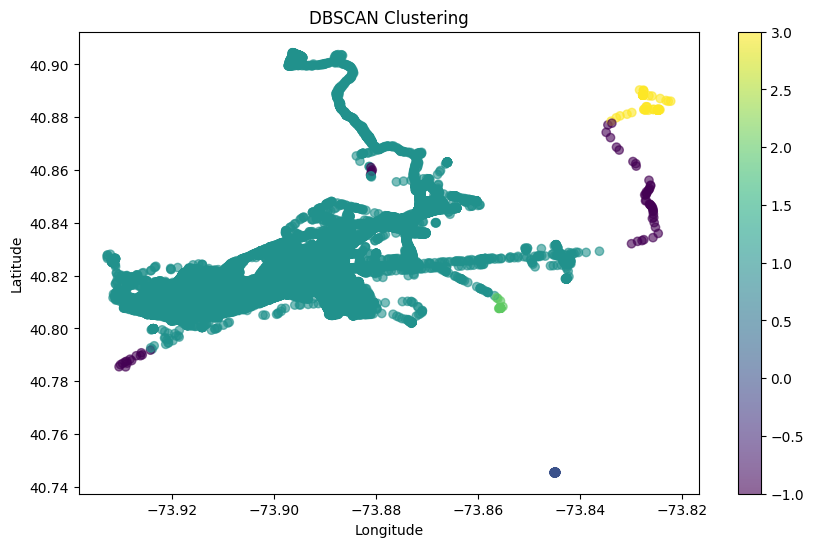

In [ ]:
coordinates_silhouette_scores2 = []
fraction_sizes = []

# Perform analysis for each sampling fraction
for fraction in sampling_fractions:
    print(f"Analyzing for Sampling Fraction: {fraction}")
    stratified_sample, coords = sample_and_cluster(data, fraction, eps_km, min_samples)
    sil_score = calculate_silhouette(coords, stratified_sample['cluster'])
    if sil_score is not None:
        coordinates_silhouette_scores2.append(sil_score)
        fraction_sizes.append(fraction)
    visualize_clusters(stratified_sample)

In [ ]:
coordinates_silhouette_scores2

[0.36609092349875905, 0.3147931693623655, 0.34136774768812267]

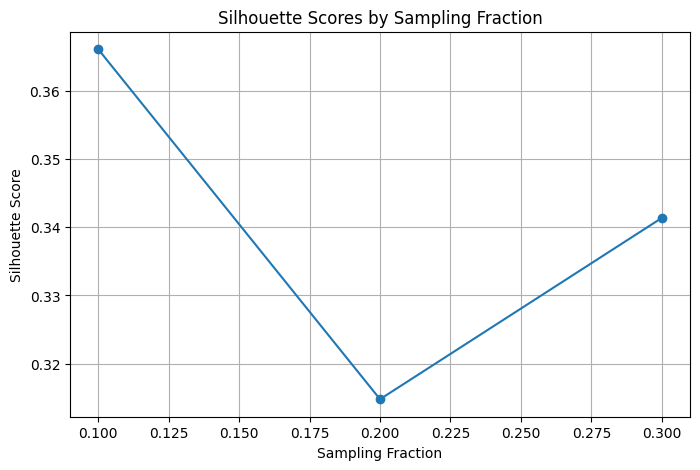

In [ ]:
# Plotting silhouette scores against sampling fractions
plt.figure(figsize=(8, 5))
plt.plot(fraction_sizes, coordinates_silhouette_scores2, marker='o', linestyle='-')
plt.title('Silhouette Scores by Sampling Fraction')
plt.xlabel('Sampling Fraction')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()

#### `eps = 1` and `min_samples = 15`

In [ ]:
# Defining parameters for DBSCAN
sampling_fractions = [0.1, 0.2, 0.3]
eps_km = 1  # Epsilon in kilometers
min_samples = 15  # Minimum number of samples to form a cluster

Analyzing for Sampling Fraction: 0.1
Number of clusters formed: 3


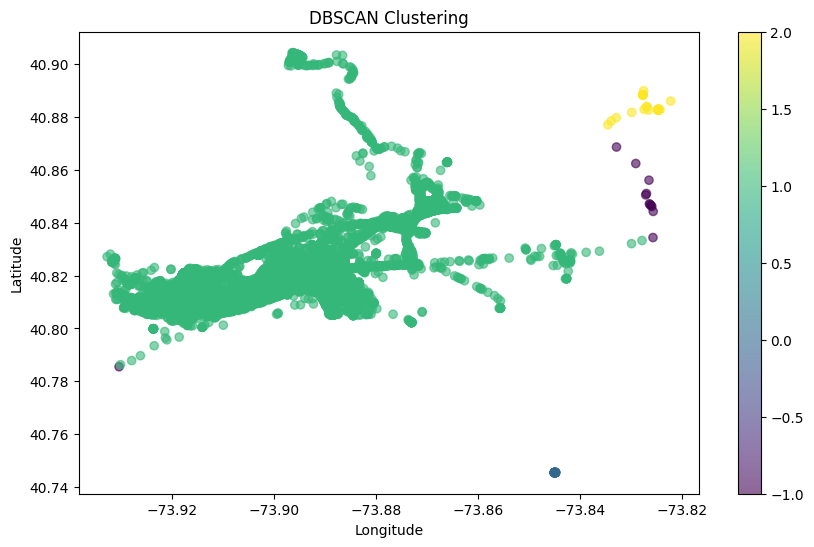

Analyzing for Sampling Fraction: 0.2
Number of clusters formed: 4


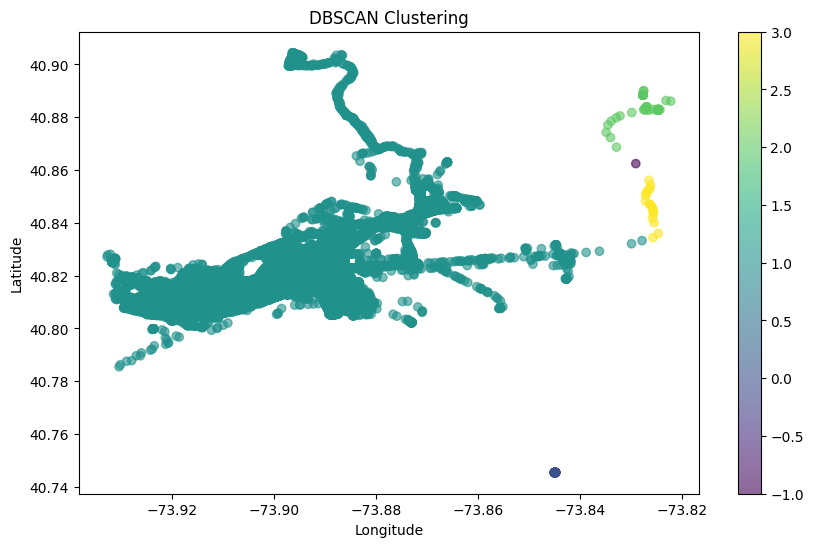

Analyzing for Sampling Fraction: 0.3
Number of clusters formed: 4


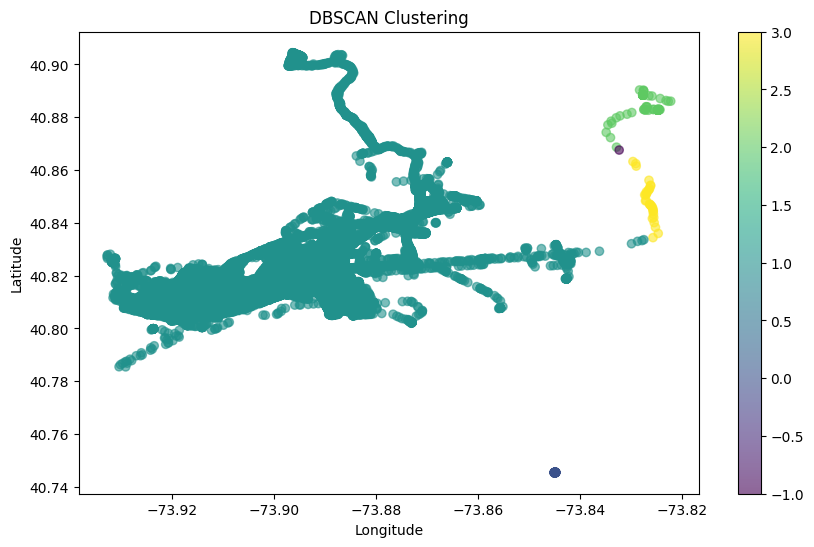

In [ ]:
coordinates_silhouette_scores3 = []
fraction_sizes = []

# Perform analysis for each sampling fraction
for fraction in sampling_fractions:
    print(f"Analyzing for Sampling Fraction: {fraction}")
    stratified_sample, coords = sample_and_cluster(data, fraction, eps_km, min_samples)
    sil_score = calculate_silhouette(coords, stratified_sample['cluster'])
    if sil_score is not None:
        coordinates_silhouette_scores3.append(sil_score)
        fraction_sizes.append(fraction)
    visualize_clusters(stratified_sample)

In [ ]:
coordinates_silhouette_scores3

[0.6117457223884887, 0.5144402136892775, 0.5159410056817152]

### X-Y Graphs

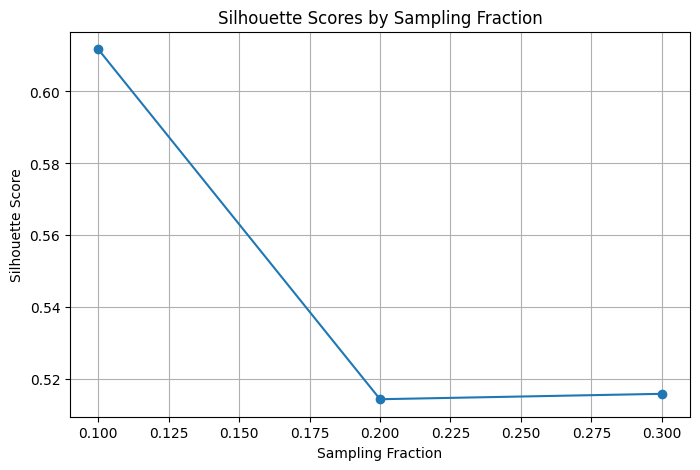

In [ ]:
# Plotting silhouette scores against sampling fractions
plt.figure(figsize=(8, 5))
plt.plot(fraction_sizes, coordinates_silhouette_scores3, marker='o', linestyle='-')
plt.title('Silhouette Scores by Sampling Fraction')
plt.xlabel('Sampling Fraction')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()

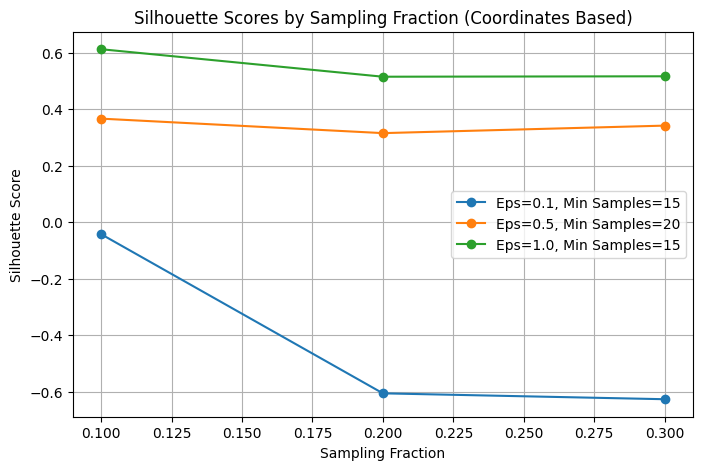

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(fraction_sizes, coordinates_silhouette_scores1, marker='o', linestyle='-', label='Eps=0.1, Min Samples=15')
plt.plot(fraction_sizes, coordinates_silhouette_scores2, marker='o', linestyle='-', label='Eps=0.5, Min Samples=20')
plt.plot(fraction_sizes, coordinates_silhouette_scores3, marker='o', linestyle='-', label='Eps=1.0, Min Samples=15')
plt.title('Silhouette Scores by Sampling Fraction (Coordinates Based)')
plt.xlabel('Sampling Fraction')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
coord_clusters1 = [27, 34, 30]
coord_clusters2 = [6, 4, 4]
coord_clusters3 = [3, 4, 4]

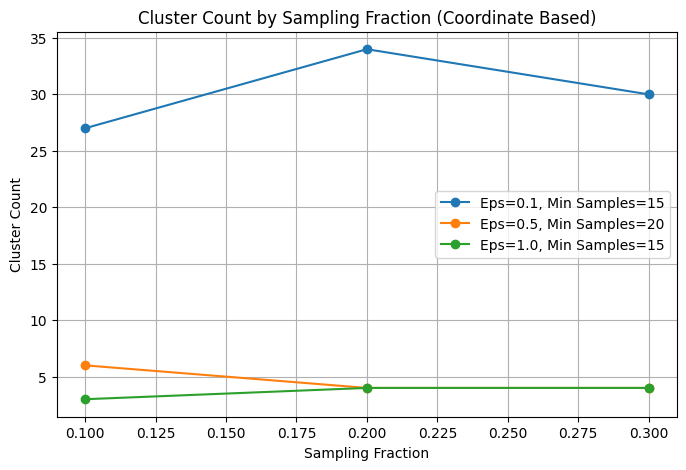

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(fraction_sizes, coord_clusters1, marker='o', linestyle='-', label='Eps=0.1, Min Samples=15')
plt.plot(fraction_sizes, coord_clusters2, marker='o', linestyle='-', label='Eps=0.5, Min Samples=20')
plt.plot(fraction_sizes, coord_clusters3, marker='o', linestyle='-', label='Eps=1.0, Min Samples=15')
plt.title('Cluster Count by Sampling Fraction (Coordinate Based)')
plt.xlabel('Sampling Fraction')
plt.ylabel('Cluster Count')
plt.legend()
plt.grid(True)
plt.show()

### Time of Training

In [ ]:
def TrainingTime(data, sampling_fraction, eps_km, min_samples):
    start_time = time.time()  # Start timing

    # Stratified sampling
    sampled_data = data.groupby('geohash').apply(lambda x: x.sample(frac=sampling_fraction, random_state=42)).reset_index(drop=True)

    # Convert coordinates to radians for clustering
    coords = np.radians(sampled_data[['latitude', 'longitude']].values)

    # DBSCAN clustering
    kms_per_radian = 6371.0088  # Earth radius in kilometers
    epsilon = eps_km / kms_per_radian
    db = DBSCAN(eps=epsilon, min_samples=min_samples, algorithm='ball_tree', metric='haversine').fit(coords)
    sampled_data['cluster'] = db.labels_

    end_time = time.time()  # End timing
    training_time = end_time - start_time  # Calculate duration

    num_clusters = len(set(db.labels_)) - (1 if -1 in set(db.labels_) else 0)
    print(f'Number of clusters formed: {num_clusters}, Training Time: {training_time:.2f} seconds')

    return sampled_data, coords, training_time  # Return training time as well

In [ ]:
parameter_combinations = [
    (0.1, 15),
    (0.5, 20),
    (1, 15)
]

In [ ]:
training_times = []

for fraction in [0.1, 0.2, 0.3]:
    for eps_km, min_samples in parameter_combinations:
        _, _, time_taken = TrainingTime(data, fraction, eps_km, min_samples)
        training_times.append((fraction, eps_km, min_samples, time_taken))

Number of clusters formed: 27, Training Time: 0.85 seconds
Number of clusters formed: 6, Training Time: 1.32 seconds
Number of clusters formed: 3, Training Time: 1.78 seconds
Number of clusters formed: 34, Training Time: 3.11 seconds
Number of clusters formed: 4, Training Time: 4.04 seconds
Number of clusters formed: 4, Training Time: 6.06 seconds
Number of clusters formed: 30, Training Time: 5.26 seconds
Number of clusters formed: 4, Training Time: 9.76 seconds
Number of clusters formed: 4, Training Time: 18.78 seconds


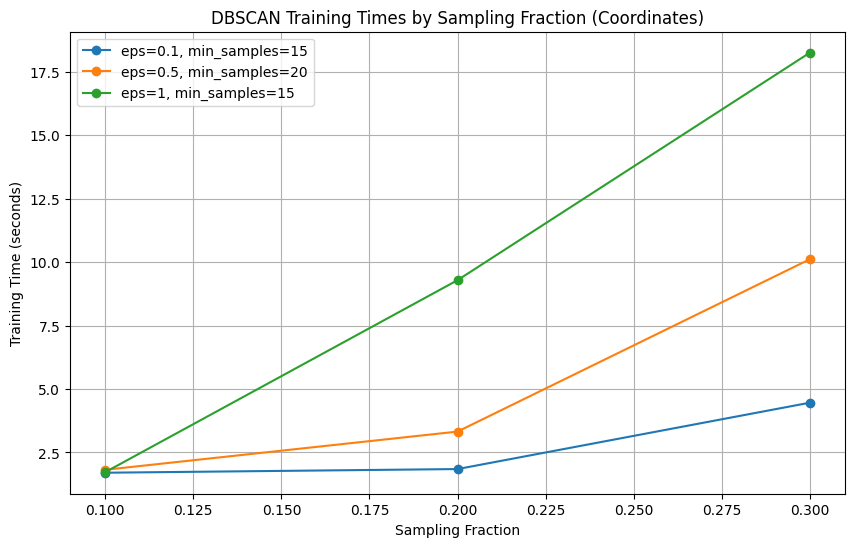

In [ ]:
import matplotlib.pyplot as plt

# Unpacking data for plotting
fractions, eps_kms, min_sampless, times = zip(*training_times)

# Assuming you want to plot against sampling fractions for simplicity
plt.figure(figsize=(10, 6))
for unique_eps in set(eps):
    for unique_min_samples in set(min_sampless):
        filtered_times = [times[i] for i in range(len(times)) if eps[i] == unique_eps and min_sampless[i] == unique_min_samples]
        if filtered_times:  # Check if the list is not empty
            plt.plot([0.1, 0.2, 0.3], filtered_times, marker='o', linestyle='-', label=f'eps={unique_eps}, min_samples={unique_min_samples}')

plt.title('DBSCAN Training Times by Sampling Fraction (Coordinates)')
plt.xlabel('Sampling Fraction')
plt.ylabel('Training Time (seconds)')
plt.legend()
plt.grid(True)
plt.show()

## Task 2

In [ ]:
def stratified_sampling(data, sampling_fractions, random_state=42):
    sampled_data = []
    for frac in sampling_fractions:
        stratified_sample = data.groupby('geohash').apply(lambda x: x.sample(frac=frac, random_state=random_state)).reset_index(drop=True)
        sampled_data.append(stratified_sample)
    return sampled_data

In [ ]:
sampling_fractions = [0.1, 0.2, 0.3]
sampled_data = stratified_sampling(data, sampling_fractions)

In [ ]:
def calculate_metrics(original_averages, sample_averages):
    original_averages = original_averages.reindex(sample_averages.index, fill_value=np.nan)
    sample_averages = sample_averages.reindex(original_averages.index, fill_value=np.nan)
    valid_mask = ~original_averages.isna() & ~sample_averages.isna()
    rmse = np.sqrt(mean_squared_error(original_averages[valid_mask], sample_averages[valid_mask]))
    mape = np.mean(np.abs((original_averages[valid_mask] - sample_averages[valid_mask]) / original_averages[valid_mask])) * 100
    return rmse, mape

In [ ]:
def analyze_neighborhoods(original_averages, sample_averages, N):
    top_n_sample = sample_averages.sort_values(ascending=False).head(N)
    top_n_original = original_averages.sort_values(ascending=False).head(N)
    correlation = top_n_sample.corr(top_n_original, method='pearson')
    prob_data = top_n_sample / top_n_sample.sum()
    prob_original = top_n_original / top_n_original.sum()
    js_divergence = jensenshannon(prob_data, prob_original)
    return top_n_sample, top_n_original, correlation, js_divergence

In [ ]:
original_averages = data.groupby('geohash')['pm25'].mean()

cnt = 0.1
for sample_data in sampled_data:
    sample_averages = sample_data.groupby('geohash')['pm25'].mean()
    rmse, mape = calculate_metrics(original_averages, sample_averages)
    top_n_sample, top_n_original, correlation, js_divergence = analyze_neighborhoods(original_averages, sample_averages, 5)

    print(f"\tFraction Size: {cnt:.2f}\n")
    print(f"RMSE: {rmse}")
    print(f"MAPE: {mape}")
    print(f"Top 5 neighborhoods based on PM2.5 concentrations in the sample: {top_n_sample}\n")
    print(f"Top 5 neighborhoods based on PM2.5 concentrations in the original data: {top_n_original}")
    print(f"Pearson Correlation: {correlation}")
    print(f"Jensen Shannon Divergence: {js_divergence}\n\n")
    cnt = cnt + 0.1

	Fraction Size: 0.10

RMSE: 0.008575797752811969
MAPE: 2.687268107422876
Top 5 neighborhoods based on PM2.5 concentrations in the sample: geohash
dr5rz    0.829280
dr782    0.306065
dr72p    0.282975
dr72q    0.260727
dr72n    0.256932
Name: pm25, dtype: float64

Top 5 neighborhoods based on PM2.5 concentrations in the original data: geohash
dr5rz    0.810263
dr782    0.298900
dr72p    0.291040
dr72q    0.264683
dr72n    0.253395
Name: pm25, dtype: float64
Pearson Correlation: 0.9997044499079747
Jensen Shannon Divergence: 0.007129638164479762


	Fraction Size: 0.20

RMSE: 0.012881226959349316
MAPE: 3.8995925849251085
Top 5 neighborhoods based on PM2.5 concentrations in the sample: geohash
dr5rz    0.790508
dr782    0.295061
dr72p    0.287786
dr72q    0.262182
dr788    0.257611
Name: pm25, dtype: float64

Top 5 neighborhoods based on PM2.5 concentrations in the original data: geohash
dr5rz    0.810263
dr782    0.298900
dr72p    0.291040
dr72q    0.264683
dr72n    0.253395
Name: pm25, dt

In [ ]:
# Calculating original and sample averages of PM2.5 concentrations per geohash
original_averages = data.groupby('geohash')['pm25'].mean()
sample_averages = stratified_sample.groupby('geohash')['pm25'].mean()

print(f"Original averages count: {original_averages.count()}")
print(f"Sample averages count: {sample_averages.count()}")

Original averages count: 13
Sample averages count: 11


In [ ]:
# Aligning the indices of both DataFrames for proper comparison
sample_averages = sample_averages.reindex(original_averages.index, fill_value=np.nan)
original_averages = original_averages.reindex(sample_averages.index, fill_value=np.nan)

# Calculating RMSE and MAPE where indices have valid data
valid_mask = ~original_averages.isna() & ~sample_averages.isna()
rmse = np.sqrt(mean_squared_error(original_averages[valid_mask], sample_averages[valid_mask]))
mape = np.mean(np.abs((original_averages[valid_mask] - sample_averages[valid_mask]) / original_averages[valid_mask])) * 100

print("RMSE:", rmse)
print("MAPE:", mape)

RMSE: 0.0039788130820738775
MAPE: 0.9004867499720197


In [ ]:
# Identifying top-N neighborhoods based on PM2.5 concentrations
N = 5
top_n_sample = sample_averages.sort_values(ascending=False).head(N)
top_n_original = original_averages.sort_values(ascending=False).head(N)

print(f"Top 5 neighborhoods based on PM2.5 concentrations in the sample: {top_n_sample}\n")
print(f"Top 5 neighborhoods based on PM2.5 concentrations in the sample: {top_n_original}")

Top 5 neighborhoods based on PM2.5 concentrations in the sample: geohash
dr5rz    0.818539
dr782    0.298888
dr72p    0.290637
dr72q    0.263865
dr788    0.257401
Name: pm25, dtype: float64

Top 5 neighborhoods based on PM2.5 concentrations in the sample: geohash
dr5rz    0.810263
dr782    0.298900
dr72p    0.291040
dr72q    0.264683
dr72n    0.253395
Name: pm25, dtype: float64


In [ ]:
# Computing Pearson Correlation and Jensen Shannon Divergence for top-N neighborhoods
correlation = top_n_sample.corr(top_n_original, method='pearson')

prob_data = top_n_sample / top_n_sample.sum()
prob_original = top_n_original / top_n_original.sum()
js_divergence = jensenshannon(prob_data, prob_original)

print("Pearson Correlation:", correlation)
print("Jensen Shannon Divergence:", js_divergence)

Pearson Correlation: 0.9999999010622262
Jensen Shannon Divergence: 0.0023719492495256024


### QoS

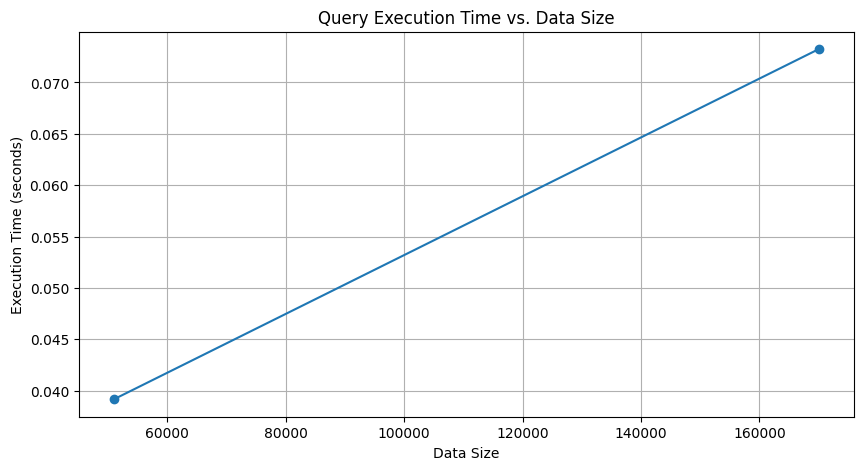

In [ ]:
# Measure the execution times for computing average PM2.5 per geohash on the full dataset and the stratified sample
start_time_full = time.time()
avg_pm25_full = data.groupby('geohash')['pm25'].mean()
end_time_full = time.time()

start_time_sample = time.time()
avg_pm25_sample = stratified_sample.groupby('geohash')['pm25'].mean()
end_time_sample = time.time()

execution_time_full = end_time_full - start_time_full
execution_time_sample = end_time_sample - start_time_sample

# Plotting execution times
sizes = [len(data), len(stratified_sample)]
times = [execution_time_full, execution_time_sample]

plt.figure(figsize=(10, 5))
plt.plot(sizes, times, marker='o')
plt.title('Query Execution Time vs. Data Size')
plt.xlabel('Data Size')
plt.ylabel('Execution Time (seconds)')
plt.grid(True)
plt.show()

## Task 3

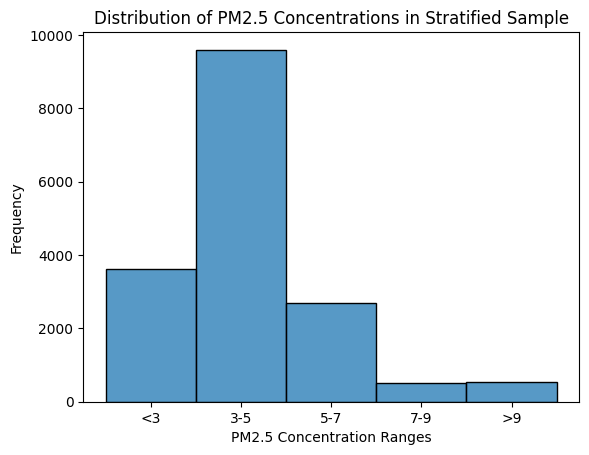

In [ ]:
pm25_ranges = [0, 3, 5, 7, 9, float('inf')]
labels = ['<3', '3-5', '5-7', '7-9', '>9']

sampled_data[0]['pm25_category'] = pd.cut(sampled_data[0]['pm25'], bins=pm25_ranges, labels=labels)
sns.histplot(sampled_data[0]['pm25_category'], bins = np.arange(0,10,2))
plt.xlabel('PM2.5 Concentration Ranges')
plt.ylabel('Frequency')
plt.title('Distribution of PM2.5 Concentrations in Stratified Sample')
plt.show()

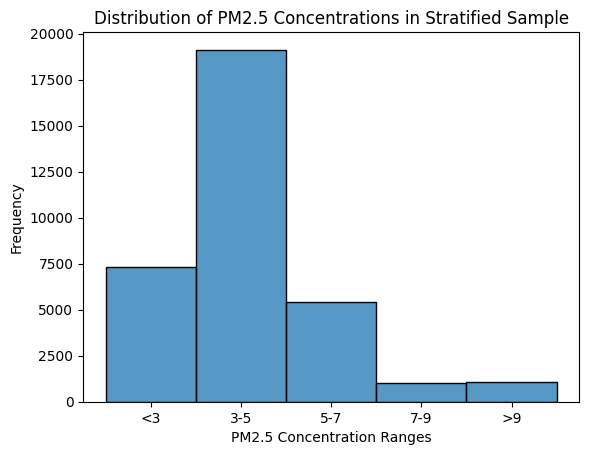

In [ ]:
pm25_ranges = [0, 3, 5, 7, 9, float('inf')]
labels = ['<3', '3-5', '5-7', '7-9', '>9']

sampled_data[1]['pm25_category'] = pd.cut(sampled_data[1]['pm25'], bins=pm25_ranges, labels=labels)
sns.histplot(sampled_data[1]['pm25_category'], bins = np.arange(0,10,2))
plt.xlabel('PM2.5 Concentration Ranges')
plt.ylabel('Frequency')
plt.title('Distribution of PM2.5 Concentrations in Stratified Sample')
plt.show()

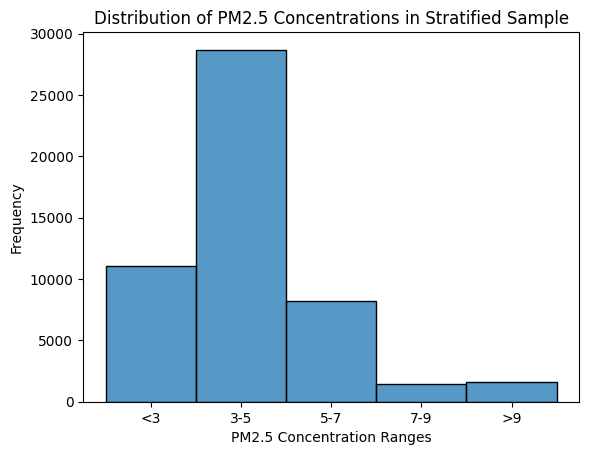

In [ ]:
pm25_ranges = [0, 3, 5, 7, 9, float('inf')]
labels = ['<3', '3-5', '5-7', '7-9', '>9']

sampled_data[2]['pm25_category'] = pd.cut(sampled_data[2]['pm25'], bins=pm25_ranges, labels=labels)
sns.histplot(sampled_data[2]['pm25_category'], bins = np.arange(0,10,2))
plt.xlabel('PM2.5 Concentration Ranges')
plt.ylabel('Frequency')
plt.title('Distribution of PM2.5 Concentrations in Stratified Sample')
plt.show()

In [ ]:
def prepare_and_cluster(data, fraction, eps, min_samples):
    """Performing stratified sampling, scaling features, and running DBSCAN clustering.
    Returning clustered data and silhouette score, and printing the number of clusters formed."""
    # Stratified sampling based on geohash and fraction size
    sampled_data = data.groupby('geohash').sample(frac=fraction, random_state=42).reset_index(drop=True)

    # Scaling features for clustering
    scaler = StandardScaler()
    features = sampled_data[['latitude', 'longitude', 'pm25']]
    features_scaled = scaler.fit_transform(features)

    # Running DBSCAN with specified parameters
    db = DBSCAN(eps=eps, min_samples=min_samples)
    labels = db.fit_predict(features_scaled)
    sampled_data['cluster'] = labels

    # Counting unique clusters
    num_clusters = len(set(labels)) - (1 if -1 in set(labels) else 0)  # Adjust for noise represented by label -1
    print(f'Number of clusters formed for fraction {fraction}: {num_clusters}')

    # Calculating silhouette score if more than one cluster is identified
    if num_clusters > 1:
        sil_score = silhouette_score(features_scaled, labels)
    else:
        sil_score = None  # No valid score if there's only one cluster or none

    return sampled_data, sil_score


In [ ]:
def plot_clusters(sample):
    """Visualizing the clusters."""
    plt.scatter(sample['longitude'], sample['latitude'], c=sample['cluster'], cmap='viridis', alpha=0.5)
    plt.colorbar()
    plt.title('DBSCAN Clustering of Stratified Sample')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.show()

`Testing different DBSCAN parameters`:

#### `eps = 0.1` and `min_samples = 15`

In [ ]:
# Defining parameters for DBSCAN
sampling_fractions = [0.1, 0.2, 0.3]
eps = 0.1
min_samples = 15

Number of clusters formed for fraction 0.1: 59
Results for fraction size: 0.1


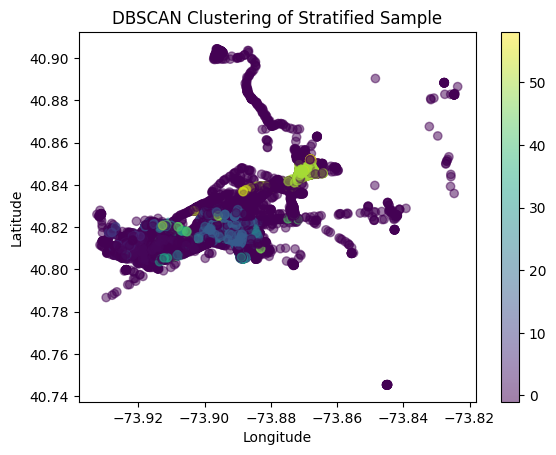

Number of clusters formed for fraction 0.2: 81
Results for fraction size: 0.2


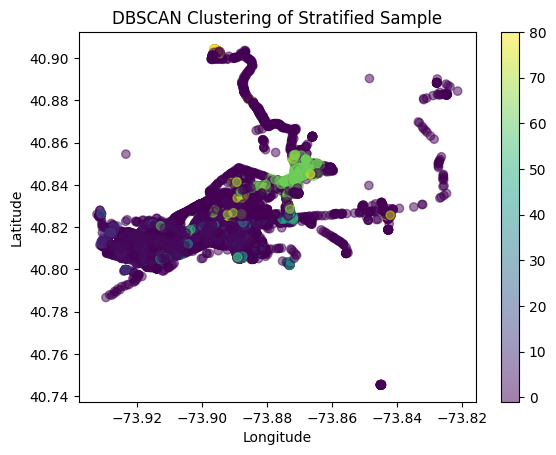

Number of clusters formed for fraction 0.3: 90
Results for fraction size: 0.3


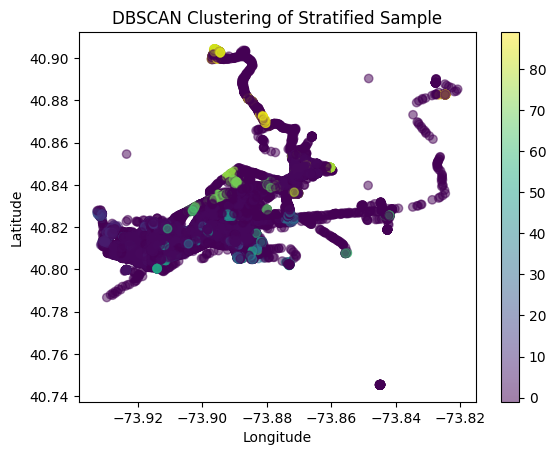

In [ ]:
silhouette_scores1 = []
for fraction in fraction_sizes:
    clustered_data, sil_score = prepare_and_cluster(data, fraction, eps, min_samples)
    silhouette_scores1.append(sil_score)
    print(f"Results for fraction size: {fraction}")
    plot_clusters(clustered_data)

In [ ]:
silhouette_scores1

[-0.40229777257920607, -0.46363471874176115, -0.6282053405867156]

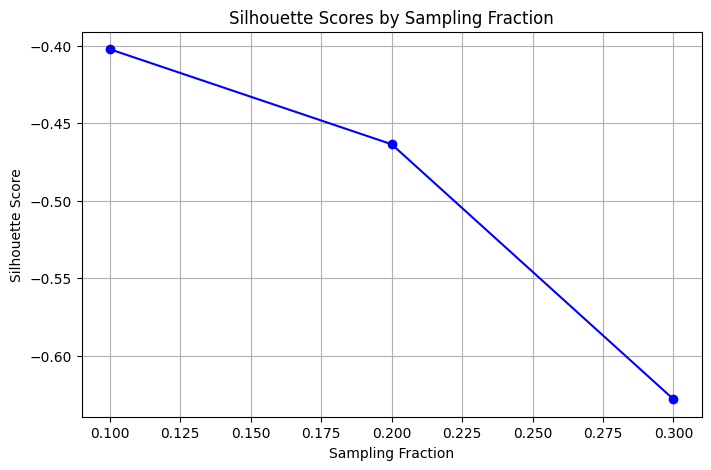

In [ ]:
# Plotting silhouette scores
plt.figure(figsize=(8, 5))
plt.plot(fraction_sizes, silhouette_scores1, marker='o', linestyle='-', color='blue')
plt.title('Silhouette Scores by Sampling Fraction')
plt.xlabel('Sampling Fraction')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()

#### `eps = 0.5` and `min_samples = 20`

In [ ]:
# Defining parameters for DBSCAN
sampling_fractions = [0.1, 0.2, 0.3]
eps = 0.5
min_samples = 20

Number of clusters formed for fraction 0.1: 5
Results for fraction size: 0.1


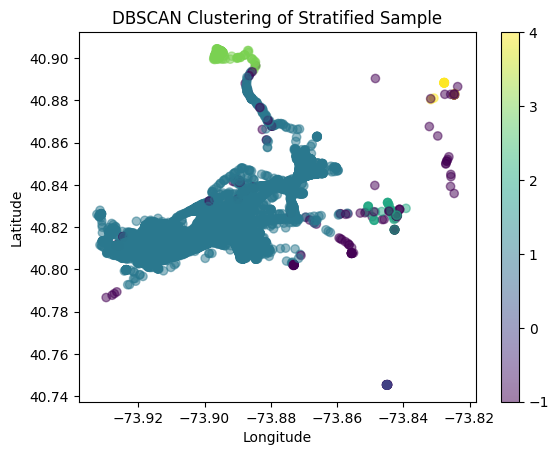

Number of clusters formed for fraction 0.2: 4
Results for fraction size: 0.2


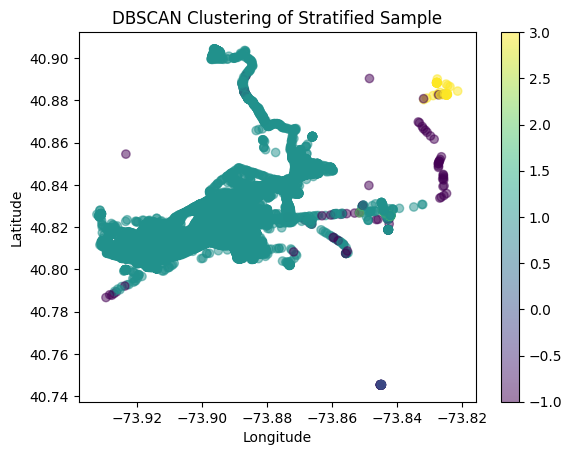

Number of clusters formed for fraction 0.3: 4
Results for fraction size: 0.3


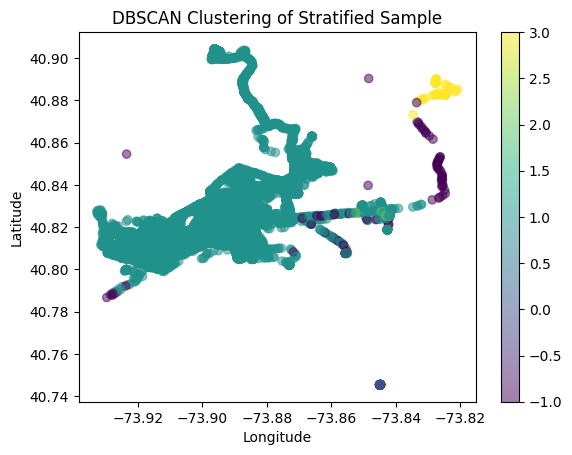

In [ ]:
silhouette_scores2 = []
for fraction in fraction_sizes:
    clustered_data, sil_score = prepare_and_cluster(data, fraction, eps, min_samples)
    silhouette_scores2.append(sil_score)
    print(f"Results for fraction size: {fraction}")
    plot_clusters(clustered_data)

In [ ]:
silhouette_scores2

[0.238221479732912, 0.43126277125770973, 0.42915895558903694]

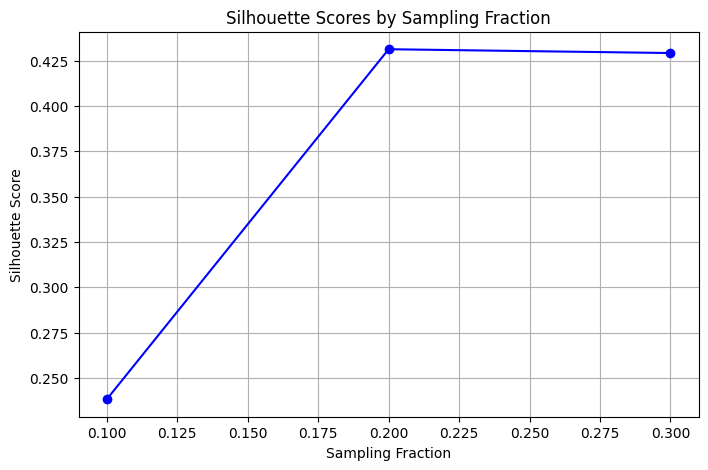

In [ ]:
# Plotting silhouette scores
plt.figure(figsize=(8, 5))
plt.plot(fraction_sizes, silhouette_scores2, marker='o', linestyle='-', color='blue')
plt.title('Silhouette Scores by Sampling Fraction')
plt.xlabel('Sampling Fraction')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()

#### `eps = 1` and `min_samples = 15`

In [ ]:
# Defining parameters for DBSCAN
sampling_fractions = [0.1, 0.2, 0.3]
eps = 1
min_samples = 15

Number of clusters formed for fraction 0.1: 3
Results for fraction size: 0.1


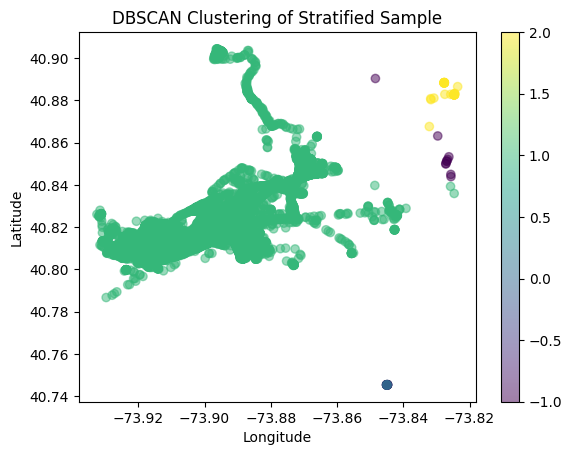

Number of clusters formed for fraction 0.2: 3
Results for fraction size: 0.2


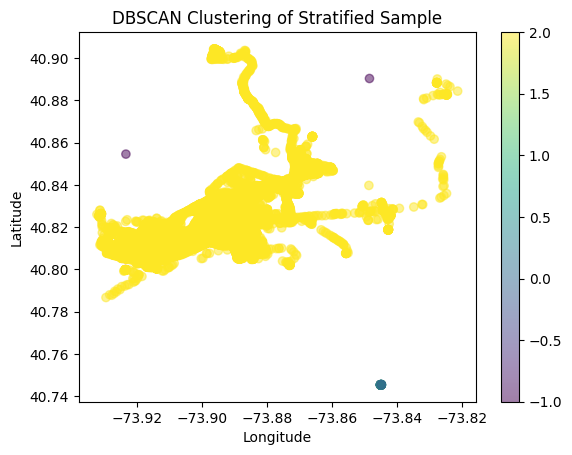

Number of clusters formed for fraction 0.3: 2
Results for fraction size: 0.3


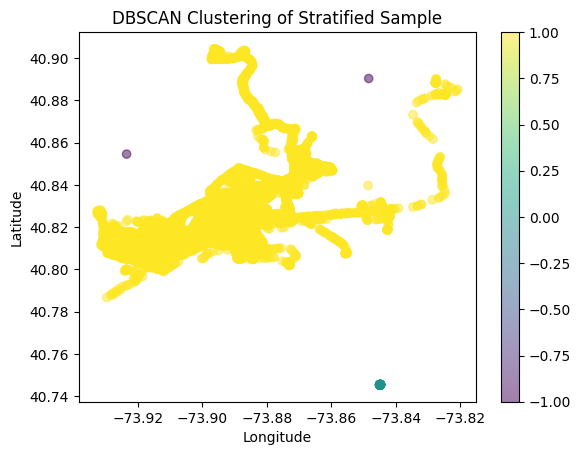

In [ ]:
silhouette_scores3= []
for fraction in fraction_sizes:
    clustered_data, sil_score = prepare_and_cluster(data, fraction, eps, min_samples)
    silhouette_scores3.append(sil_score)
    print(f"Results for fraction size: {fraction}")
    plot_clusters(clustered_data)

In [ ]:
silhouette_scores3

[0.512118245708258, 0.4222492861740098, 0.42317965297452703]

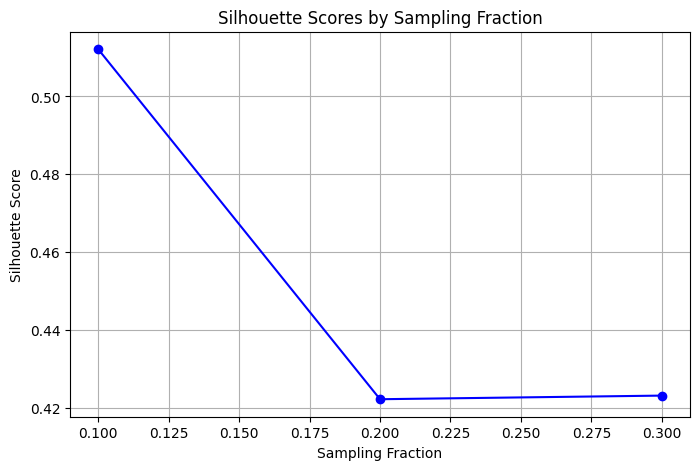

In [ ]:
# Plotting silhouette scores
plt.figure(figsize=(8, 5))
plt.plot(fraction_sizes, silhouette_scores3, marker='o', linestyle='-', color='blue')
plt.title('Silhouette Scores by Sampling Fraction')
plt.xlabel('Sampling Fraction')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()

### X-Y Graph

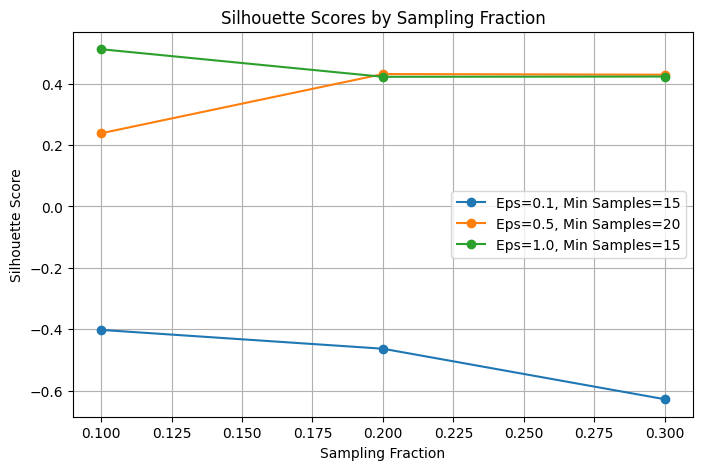

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(fraction_sizes, silhouette_scores1, marker='o', linestyle='-', label='Eps=0.1, Min Samples=15')
plt.plot(fraction_sizes, silhouette_scores2, marker='o', linestyle='-', label='Eps=0.5, Min Samples=20')
plt.plot(fraction_sizes, silhouette_scores3, marker='o', linestyle='-', label='Eps=1.0, Min Samples=15')
plt.title('Silhouette Scores by Sampling Fraction')
plt.xlabel('Sampling Fraction')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
features_clusters1 = [59, 81, 90]
features_clusters2 = [5, 4, 4]
features_clusters3 = [3, 3, 2]

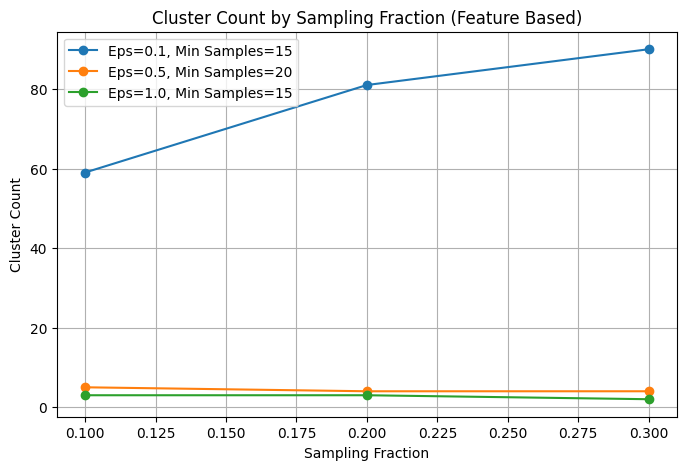

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(fraction_sizes, features_clusters1, marker='o', linestyle='-', label='Eps=0.1, Min Samples=15')
plt.plot(fraction_sizes, features_clusters2, marker='o', linestyle='-', label='Eps=0.5, Min Samples=20')
plt.plot(fraction_sizes, features_clusters3, marker='o', linestyle='-', label='Eps=1.0, Min Samples=15')
plt.title('Cluster Count by Sampling Fraction (Feature Based)')
plt.xlabel('Sampling Fraction')
plt.ylabel('Cluster Count')
plt.legend()
plt.grid(True)
plt.show()


### Training Time

In [ ]:
def measure_clustering_time(data, fraction, eps, min_samples):
    """Performing stratified sampling, scaling features, and running DBSCAN clustering.
    Returning clustered data and silhouette score, and printing the number of clusters formed and training time."""

    # Start timing
    start_time = time.time()

    # Stratified sampling based on geohash and fraction size
    sampled_data = data.groupby('geohash').sample(frac=fraction, random_state=42).reset_index(drop=True)

    # Scaling features for clustering
    scaler = StandardScaler()
    features = sampled_data[['latitude', 'longitude', 'pm25']]
    features_scaled = scaler.fit_transform(features)

    # Running DBSCAN with specified parameters
    db = DBSCAN(eps=eps, min_samples=min_samples)
    labels = db.fit_predict(features_scaled)
    sampled_data['cluster'] = labels

    # Counting unique clusters
    num_clusters = len(set(labels)) - (1 if -1 in set(labels) else 0)
    print(f'Number of clusters formed for fraction {fraction}: {num_clusters}')

    # Calculating silhouette score if more than one cluster is identified

    # Stop timing and calculate duration
    end_time = time.time()
    training_time = end_time - start_time
    print(f'Training time: {training_time:.2f} seconds')

    return training_time

In [ ]:
parameter_combinations = [
    (0.1, 15),
    (0.5, 20),
    (1, 15)
]

In [ ]:
training_times = []

for fraction in [0.1, 0.2, 0.3]:
    for eps, min_samples in parameter_combinations:
        time_taken = measure_clustering_time(data, fraction, eps, min_samples)
        training_times.append((fraction, eps, min_samples, time_taken))


Number of clusters formed for fraction 0.1: 59
Training time: 0.39 seconds
Number of clusters formed for fraction 0.1: 5
Training time: 1.25 seconds
Number of clusters formed for fraction 0.1: 3
Training time: 2.06 seconds
Number of clusters formed for fraction 0.2: 81
Training time: 0.94 seconds
Number of clusters formed for fraction 0.2: 4
Training time: 4.47 seconds
Number of clusters formed for fraction 0.2: 3
Training time: 7.61 seconds
Number of clusters formed for fraction 0.3: 90
Training time: 1.50 seconds
Number of clusters formed for fraction 0.3: 4
Training time: 7.96 seconds
Number of clusters formed for fraction 0.3: 2
Training time: 17.84 seconds


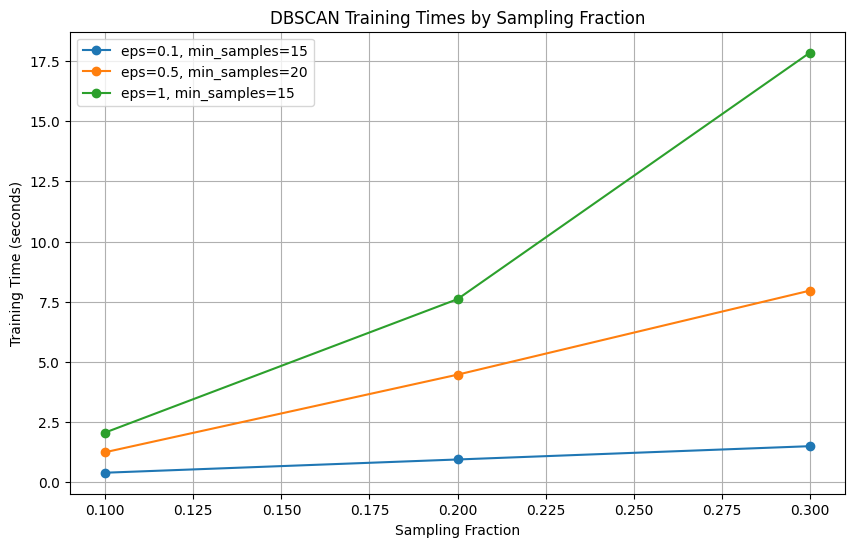

In [ ]:
import matplotlib.pyplot as plt

# Unpacking data for plotting
fractions, eps, min_sampless, times = zip(*training_times)

# Assuming you want to plot against sampling fractions for simplicity
plt.figure(figsize=(10, 6))
for unique_eps in set(eps):
    for unique_min_samples in set(min_sampless):
        filtered_times = [times[i] for i in range(len(times)) if eps[i] == unique_eps and min_sampless[i] == unique_min_samples]
        if filtered_times:  # Check if the list is not empty
            plt.plot([0.1, 0.2, 0.3], filtered_times, marker='o', linestyle='-', label=f'eps={unique_eps}, min_samples={unique_min_samples}')

plt.title('DBSCAN Training Times by Sampling Fraction')
plt.xlabel('Sampling Fraction')
plt.ylabel('Training Time (seconds)')
plt.legend()
plt.grid(True)
plt.show()

# Mobility Data

In [ ]:
data = pd.read_csv("https://github.com/IsamAljawarneh/datasets/raw/master/data/nyc1.zip")
geo_json_file = gpd.read_file('https://raw.githubusercontent.com/IsamAljawarneh/datasets/master/data/nyc_polygon.geojson')

## EDA

### Data

In [ ]:
data.head()

,id,VendorID,lpep_pickup_datetime,Lpep_dropoff_datetime,Store_and_fwd_flag,RateCodeID,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude,...,Fare_amount,Extra,MTA_tax,Tip_amount,Tolls_amount,Ehail_fee,improvement_surcharge,Total_amount,Payment_type,Trip_type
0,0,2,2016-01-01 00:29:24,2016-01-01 00:39:36,N,1,-73.928642,40.680611,-73.924278,40.698044,...,8.0,0.5,0.5,1.86,0.0,NaN,0.3,11.16,1,1.0
1,1,2,2016-01-01 00:19:39,2016-01-01 00:39:18,N,1,-73.952675,40.723175,-73.923920,40.761379,...,15.5,0.5,0.5,0.00,0.0,NaN,0.3,16.80,2,1.0
2,2,2,2016-01-01 00:19:33,2016-01-01 00:39:48,N,1,-73.971611,40.676105,-74.013161,40.646072,...,16.5,0.5,0.5,4.45,0.0,NaN,0.3,22.25,1,1.0
3,3,2,2016-01-01 00:22:12,2016-01-01 00:38:32,N,1,-73.989502,40.669579,-74.000648,40.689034,...,13.5,0.5,0.5,0.00,0.0,NaN,0.3,14.80,2,1.0
4,4,2,2016-01-01 00:24:01,2016-01-01 00:39:22,N,1,-73.964729,40.682854,-73.940720,40.663013,...,12.0,0.5,0.5,0.00,0.0,NaN,0.3,13.30,2,1.0


In [ ]:
data.dtypes

id                         int64
VendorID                   int64
lpep_pickup_datetime      object
Lpep_dropoff_datetime     object
Store_and_fwd_flag        object
RateCodeID                 int64
Pickup_longitude         float64
Pickup_latitude          float64
Dropoff_longitude        float64
Dropoff_latitude         float64
Passenger_count            int64
Trip_distance            float64
Fare_amount              float64
Extra                    float64
MTA_tax                  float64
Tip_amount               float64
Tolls_amount             float64
Ehail_fee                float64
improvement_surcharge    float64
Total_amount             float64
Payment_type               int64
Trip_type                float64
dtype: object

In [ ]:
len(data)

1445285

In [ ]:
# Converting lpep_pickup_datetime and Lpep_dropoff_datetime form 'object' datatypes to datetime objects.
data['lpep_pickup_datetime'] = pd.to_datetime(data['lpep_pickup_datetime'])
data['Lpep_dropoff_datetime'] = pd.to_datetime(data['Lpep_dropoff_datetime'])

In [ ]:
data.dtypes

id                                int64
VendorID                          int64
lpep_pickup_datetime     datetime64[ns]
Lpep_dropoff_datetime    datetime64[ns]
Store_and_fwd_flag               object
RateCodeID                        int64
Pickup_longitude                float64
Pickup_latitude                 float64
Dropoff_longitude               float64
Dropoff_latitude                float64
Passenger_count                   int64
Trip_distance                   float64
Fare_amount                     float64
Extra                           float64
MTA_tax                         float64
Tip_amount                      float64
Tolls_amount                    float64
Ehail_fee                       float64
improvement_surcharge           float64
Total_amount                    float64
Payment_type                      int64
Trip_type                       float64
dtype: object

In [ ]:
# pickup_day --> name of day on which ride was taken
data['pickup_day'] = data['lpep_pickup_datetime'].apply(lambda x: x.strftime(("%A")))

# dropoff_day --> name of day on which ride was taken
data['dropoff_day'] = data['Lpep_dropoff_datetime'].apply(lambda x: x.strftime(("%A")))

In [ ]:
# pickup_day_no --> day number , Monday=0 and Sunday=6
data['pickup_day_no'] = data['lpep_pickup_datetime'].dt.dayofweek

# dropoff_day_no --> day number , Monday=0 and Sunday=6
data['dropoff_day_no'] = data['Lpep_dropoff_datetime'].dt.dayofweek

In [ ]:
# pickup_hour --> hour of the day in the 24-hour format
data['pickup_hour'] = data['lpep_pickup_datetime'].apply(lambda x: x.time().hour)

# dropoff_hour --> hour of the day in the 24-hour format
data['dropoff_hour'] = data['Lpep_dropoff_datetime'].apply(lambda x: x.time().hour)

In [ ]:
def time_of_day(hour):
  if hour>=6 and hour<=11:
      return 'Morning'
  elif hour>=12 and hour<=15:
      return 'Afternoon'
  elif hour>=16 and hour<=21:
      return 'Evening'
  else:
      return 'Late Night'

In [ ]:
# pickup_month --> month number January=1 and December=12
data['pickup_month'] = data['lpep_pickup_datetime'].dt.month

# dropoff_month --> month number January=1 and December=12
data['dropoff_month'] = data['Lpep_dropoff_datetime'].dt.month

In [ ]:
data['pickup_time_of_day'] = data['pickup_hour'].apply(time_of_day)
data['dropoff_time_of_day'] = data['dropoff_hour'].apply(time_of_day)

In [ ]:
from geopy.distance import great_circle
def calculate_distance(Pickup_latitude,Pickup_longitude,Dropoff_latitude,Dropoff_longitude):

 start=(Pickup_latitude,Pickup_longitude)
 end=(Dropoff_latitude,Dropoff_longitude)

 return great_circle(start,end).km

In [ ]:
data.drop('Ehail_fee', axis=1, inplace=True)

In [ ]:
data.isnull().sum()

id                       0
VendorID                 0
lpep_pickup_datetime     0
Lpep_dropoff_datetime    0
Store_and_fwd_flag       0
RateCodeID               0
Pickup_longitude         0
Pickup_latitude          0
Dropoff_longitude        0
Dropoff_latitude         0
Passenger_count          0
Trip_distance            0
Fare_amount              0
Extra                    0
MTA_tax                  0
Tip_amount               0
Tolls_amount             0
improvement_surcharge    0
Total_amount             0
Payment_type             0
Trip_type                2
pickup_day               0
dropoff_day              0
pickup_day_no            0
dropoff_day_no           0
pickup_hour              0
dropoff_hour             0
pickup_month             0
dropoff_month            0
pickup_time_of_day       0
dropoff_time_of_day      0
dtype: int64

In [ ]:
data[data['Pickup_longitude'] == 0]

,id,VendorID,lpep_pickup_datetime,Lpep_dropoff_datetime,Store_and_fwd_flag,RateCodeID,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude,...,pickup_day,dropoff_day,pickup_day_no,dropoff_day_no,pickup_hour,dropoff_hour,pickup_month,dropoff_month,pickup_time_of_day,dropoff_time_of_day
5239,5239,1,2016-01-01 00:52:17,2016-01-01 01:08:32,N,1,0.0,0.0,-73.865738,40.736492,...,Friday,Friday,4,4,0,1,1,1,Late Night,Late Night
6216,6216,1,2016-01-01 00:13:53,2016-01-01 00:20:31,N,1,0.0,0.0,-73.942871,40.787346,...,Friday,Friday,4,4,0,0,1,1,Late Night,Late Night
6424,6424,2,2016-01-01 01:03:03,2016-01-01 01:03:05,N,5,0.0,0.0,-73.908035,40.773384,...,Friday,Friday,4,4,1,1,1,1,Late Night,Late Night
7355,7355,2,2016-01-01 01:22:23,2016-01-01 01:22:24,N,1,0.0,0.0,-73.989143,40.668064,...,Friday,Friday,4,4,1,1,1,1,Late Night,Late Night
9219,9219,2,2016-01-01 01:44:37,2016-01-01 01:44:37,N,5,0.0,0.0,-73.941010,40.837357,...,Friday,Friday,4,4,1,1,1,1,Late Night,Late Night
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1443228,1443228,1,2016-01-31 22:49:47,2016-01-31 23:07:35,N,1,0.0,0.0,0.000000,0.000000,...,Sunday,Sunday,6,6,22,23,1,1,Late Night,Late Night
1443307,1443307,1,2016-01-31 22:36:19,2016-01-31 22:45:34,N,1,0.0,0.0,-73.911751,40.742580,...,Sunday,Sunday,6,6,22,22,1,1,Late Night,Late Night
1443505,1443505,1,2016-01-31 22:06:04,2016-01-31 22:14:52,N,1,0.0,0.0,0.000000,0.000000,...,Sunday,Sunday,6,6,22,22,1,1,Late Night,Late Night
1443815,1443815,2,2016-01-31 23:08:15,2016-01-31 23:08:16,N,5,0.0,0.0,-73.950165,40.811646,...,Sunday,Sunday,6,6,23,23,1,1,Late Night,Late Night


In [ ]:
data = data[data['Pickup_longitude'] != 0]

In [ ]:
data[data['Dropoff_longitude'] == 0]

,id,VendorID,lpep_pickup_datetime,Lpep_dropoff_datetime,Store_and_fwd_flag,RateCodeID,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude,...,pickup_day,dropoff_day,pickup_day_no,dropoff_day_no,pickup_hour,dropoff_hour,pickup_month,dropoff_month,pickup_time_of_day,dropoff_time_of_day
1859,1859,2,2016-01-01 00:17:05,2016-01-01 01:00:14,N,1,-73.955505,40.812393,0.0,0.0,...,Friday,Friday,4,4,0,1,1,1,Late Night,Late Night
5516,5516,1,2016-01-01 00:40:59,2016-01-01 00:47:23,N,1,-73.951279,40.786030,0.0,0.0,...,Friday,Friday,4,4,0,0,1,1,Late Night,Late Night
5640,5640,1,2016-01-01 00:38:15,2016-01-01 00:48:51,N,5,-73.956741,40.720966,0.0,0.0,...,Friday,Friday,4,4,0,0,1,1,Late Night,Late Night
5709,5709,1,2016-01-01 00:34:07,2016-01-01 00:34:07,N,1,-73.916183,40.764305,0.0,0.0,...,Friday,Friday,4,4,0,0,1,1,Late Night,Late Night
6392,6392,1,2016-01-01 00:04:02,2016-01-01 00:04:02,N,1,-73.936859,40.697750,0.0,0.0,...,Friday,Friday,4,4,0,0,1,1,Late Night,Late Night
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1431279,1431279,1,2016-01-31 17:29:50,2016-01-31 17:29:50,N,1,-73.914886,40.837719,0.0,0.0,...,Sunday,Sunday,6,6,17,17,1,1,Evening,Evening
1432023,1432023,2,2016-01-31 18:52:18,2016-01-31 19:02:18,N,1,-73.971306,40.675705,0.0,0.0,...,Sunday,Sunday,6,6,18,19,1,1,Evening,Evening
1433889,1433889,1,2016-01-31 18:49:02,2016-01-31 19:04:22,N,5,-73.939514,40.841141,0.0,0.0,...,Sunday,Sunday,6,6,18,19,1,1,Evening,Evening
1434317,1434317,1,2016-01-31 18:05:04,2016-01-31 18:05:04,N,1,-74.022179,40.766445,0.0,0.0,...,Sunday,Sunday,6,6,18,18,1,1,Evening,Evening


In [ ]:
data = data[data['Pickup_longitude'] != 0]

In [ ]:
len(data)

1442776

2506 rows with no pickup coordinates -> removed\
2325 rows with no dropoff coordinates -> removed\
Ehail_fee column Nan -> removed

### Visualization

<Axes: xlabel='pickup_hour', ylabel='Count'>

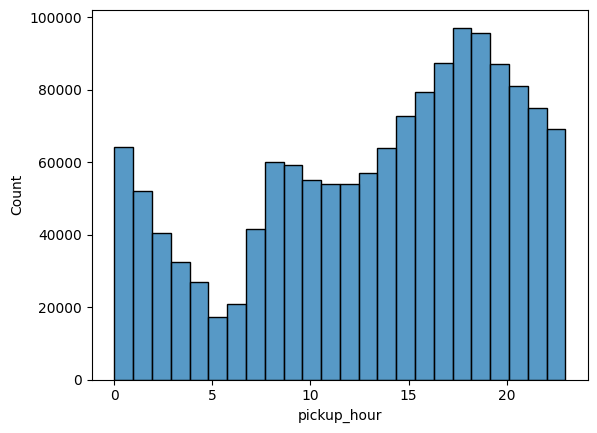

In [ ]:
import seaborn as sns
sns.histplot(data=data, x='pickup_hour', bins=24)

<Axes: xlabel='VendorID', ylabel='count'>

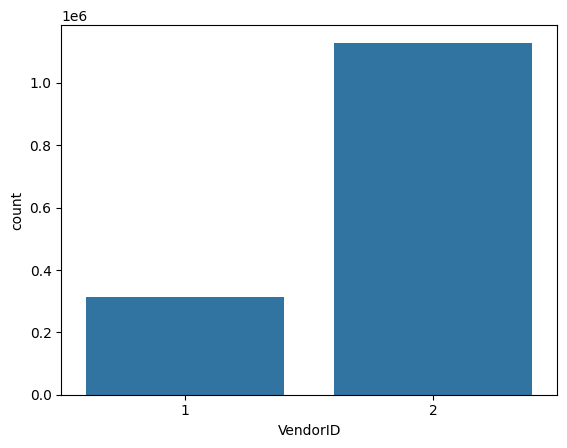

In [ ]:
sns.countplot(data, x="VendorID")

<Axes: xlabel='Passenger_count', ylabel='count'>

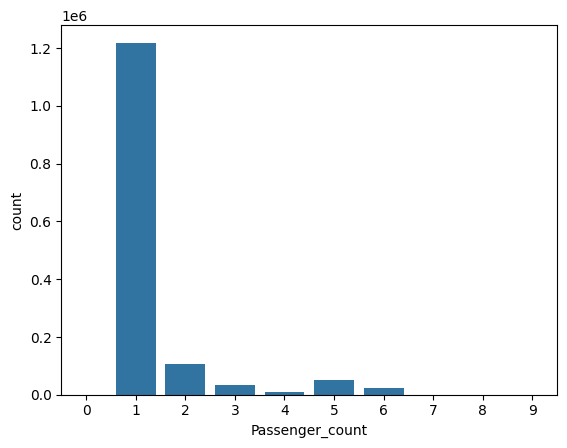

In [ ]:
sns.countplot(data, x="Passenger_count")

<Axes: xlabel='Passenger_count', ylabel='count'>

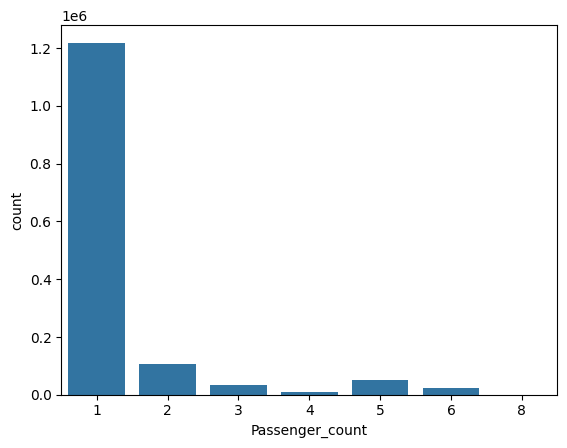

In [ ]:
remove = [0, 7, 9]
data = data[~data['Passenger_count'].isin(remove)]
sns.countplot(data, x="Passenger_count")

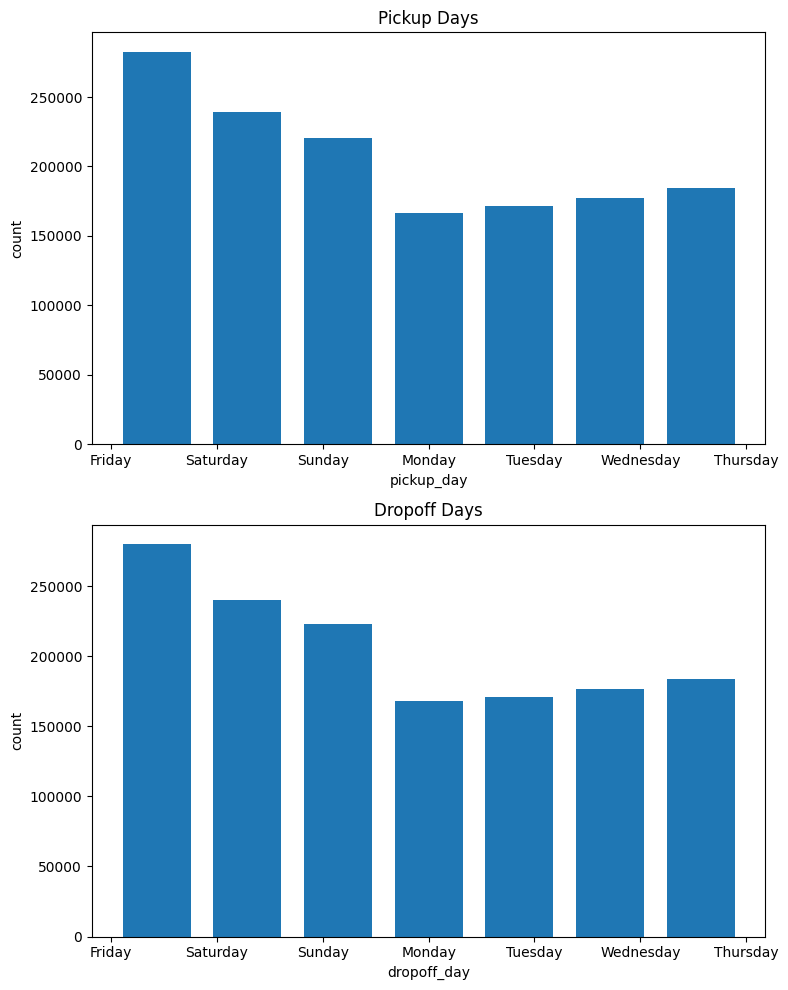

In [ ]:
fig, axs = plt.subplots(2, 1, figsize=(8, 10))

axs[0].hist(data['pickup_day'], bins=7, rwidth=0.75, align='mid')
axs[0].set_xlabel('pickup_day')
axs[0].set_ylabel('count')
axs[0].set_title('Pickup Days')

axs[1].hist(data['dropoff_day'], bins=7, rwidth=0.75, align='mid')
axs[1].set_xlabel('dropoff_day')
axs[1].set_ylabel('count')
axs[1].set_title('Dropoff Days')

plt.tight_layout()

plt.show()

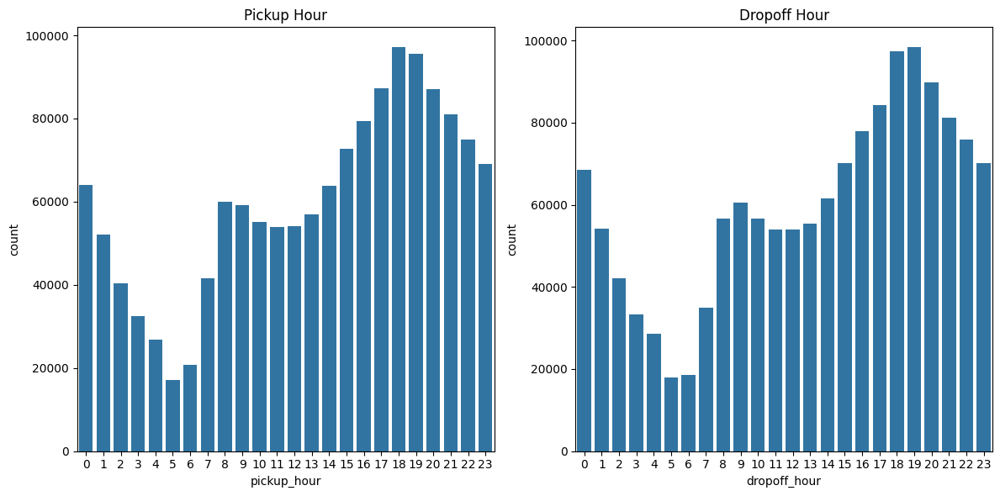

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

sns.countplot(data=data, x="pickup_hour", ax=axs[0])
axs[0].set_title('Pickup Hour')

sns.countplot(data=data, x="dropoff_hour", ax=axs[1])
axs[1].set_title('Dropoff Hour')

plt.tight_layout()

plt.show()

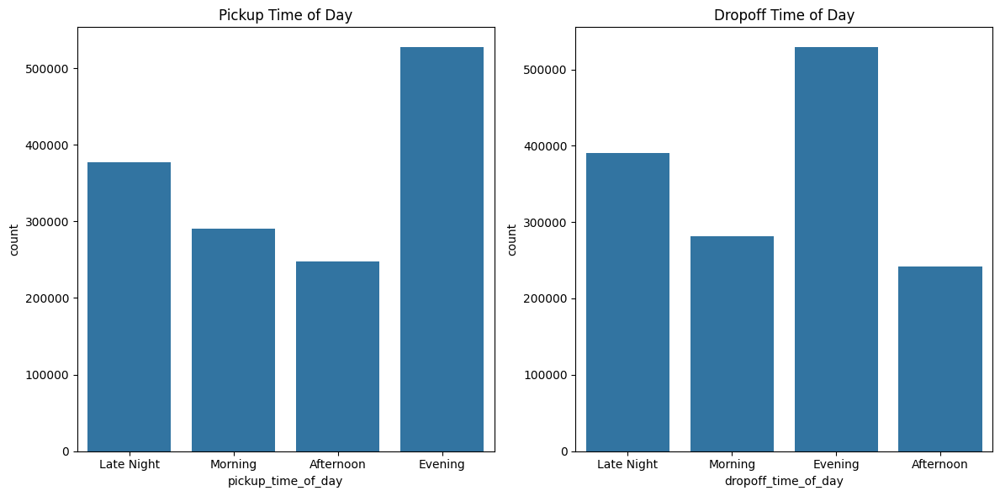

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

sns.countplot(data=data, x="pickup_time_of_day", ax=axs[0])
axs[0].set_title('Pickup Time of Day')

sns.countplot(data=data, x="dropoff_time_of_day", ax=axs[1])
axs[1].set_title('Dropoff Time of Day')

plt.tight_layout()

plt.show()

<Axes: xlabel='pickup_hour', ylabel='Trip_distance'>

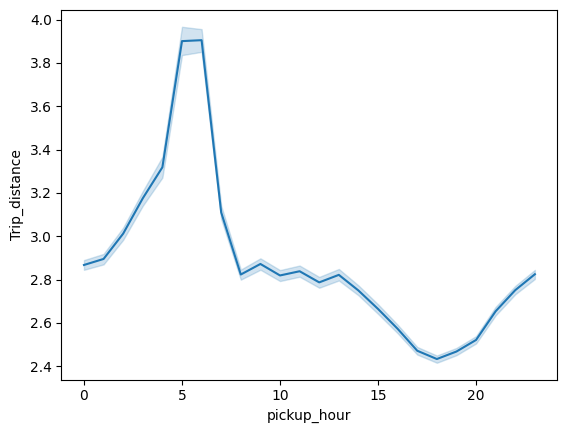

In [ ]:
sns.lineplot(data=data, x="pickup_hour", y="Trip_distance")

<ipython-input-34-c0936bea8c6e>:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(data['Pickup_longitude'], data['Pickup_latitude'], cmap='viridis', alpha=0.6)


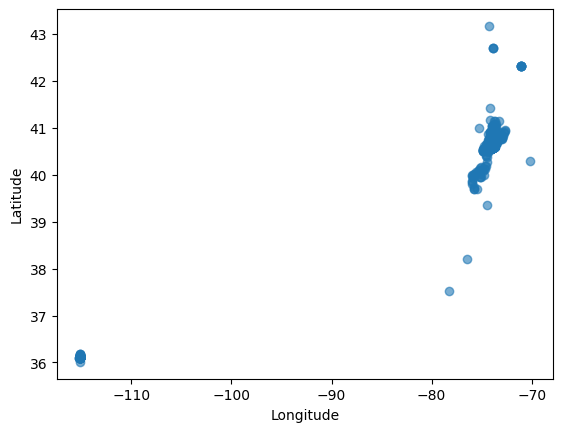

In [ ]:
plt.scatter(data['Pickup_longitude'], data['Pickup_latitude'], cmap='viridis', alpha=0.6)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

<ipython-input-35-9355792b13b8>:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(data['Dropoff_longitude'], data['Dropoff_latitude'], cmap='viridis', alpha=0.6)


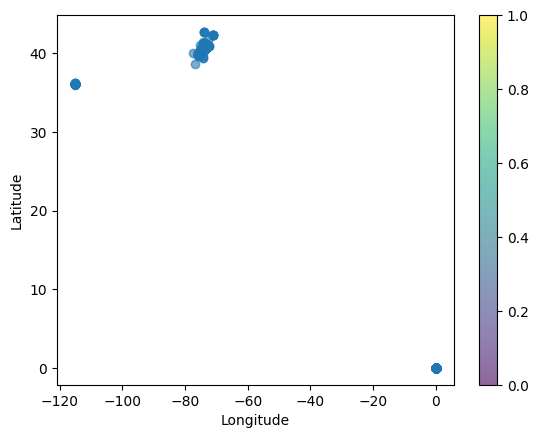

In [ ]:
plt.scatter(data['Dropoff_longitude'], data['Dropoff_latitude'], cmap='viridis', alpha=0.6)
plt.colorbar()
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

##### Maps

In [ ]:
import folium
from folium.plugins import HeatMap

In [ ]:
data.columns

Index(['id', 'VendorID', 'lpep_pickup_datetime', 'Lpep_dropoff_datetime',
       'Store_and_fwd_flag', 'RateCodeID', 'Pickup_longitude',
       'Pickup_latitude', 'Dropoff_longitude', 'Dropoff_latitude',
       'Passenger_count', 'Trip_distance', 'Fare_amount', 'Extra', 'MTA_tax',
       'Tip_amount', 'Tolls_amount', 'improvement_surcharge', 'Total_amount',
       'Payment_type', 'Trip_type', 'pickup_day', 'dropoff_day',
       'pickup_day_no', 'dropoff_day_no', 'pickup_hour', 'dropoff_hour',
       'pickup_month', 'dropoff_month', 'pickup_time_of_day',
       'dropoff_time_of_day'],
      dtype='object')

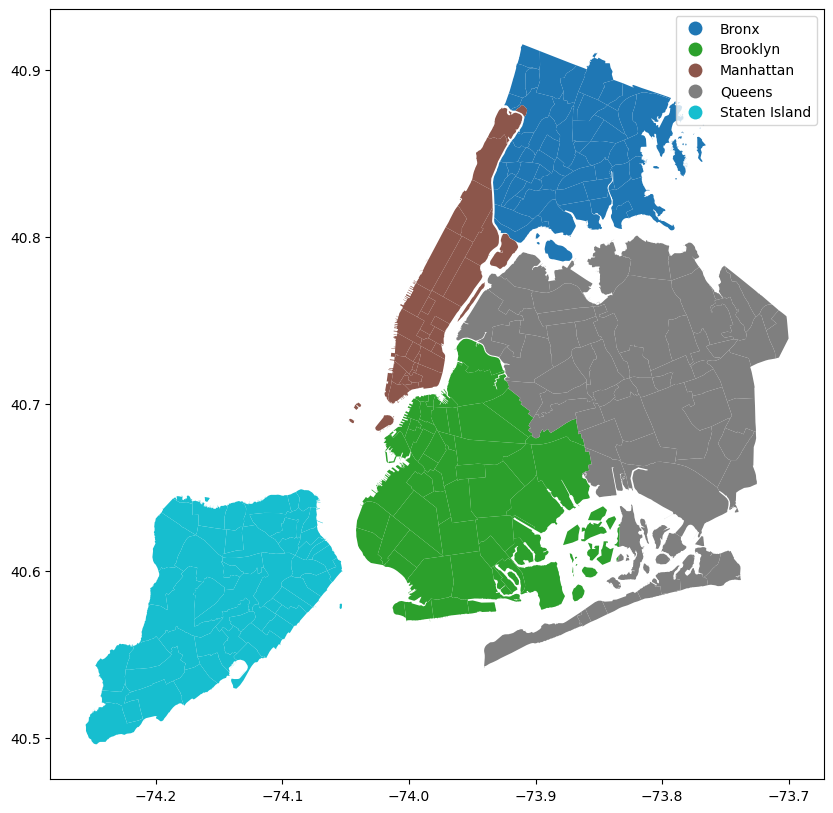

In [ ]:
sMap = geo_json_file.plot(column='borough', legend=True, figsize=(10, 10))
plt.show()


### Merged Data

In [ ]:
from geopandas.tools import sjoin

# Storing mobility data into a GeoDataFrame
gdf_mobility = gpd.GeoDataFrame(
    data,
    geometry=gpd.points_from_xy(data.Pickup_longitude, data.Pickup_latitude)
)

# Performing spatial join
merged_data = sjoin(gdf_mobility, geo_json_file, how='inner', op='within')


/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3473: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):
<ipython-input-23-24aca66da5b6>:10: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_data = sjoin(gdf_mobility, geo_json_file, how='inner', op='within')


In [ ]:
data = merged_data

## Task 1

**We used geohash for sampling instead of raw longitude and latitude to efficiently transform these coordinates into a categorical format that easily segments the geographic space into well-defined, manageable areas. This categorical representation simplifies grouping and stratification processes, ensuring that each sampled area is geographically representative without the complexities of handling continuous spatial data.**

In [ ]:
# Defining geohash precision
precision = 5

# Creating a geohash column based on longitude and latitude
data['geohash'] = data.apply(lambda x: geohash2.encode(x.Pickup_longitude, x.Pickup_latitude, precision=precision), axis=1)

In [ ]:
def sample_and_cluster(data, eps_km, min_samples):

    # Converting coordinates to radians for clustering
    coords = np.radians(data[['Pickup_latitude', 'Pickup_longitude']].values)

    # DBSCAN clustering
    kms_per_radian = 6371.0088  # Earth radius in kilometers
    epsilon = eps_km / kms_per_radian
    db = DBSCAN(eps=epsilon, min_samples=min_samples, algorithm='ball_tree', metric='haversine').fit(coords)
    data['cluster'] = db.labels_

    num_clusters = len(set(db.labels_)) - (1 if -1 in set(db.labels_) else 0)
    print(f'Number of clusters formed: {num_clusters}')

    return data, coords

In [ ]:
def visualize_clusters(data):
    plt.figure(figsize=(10, 6))
    plt.scatter(data['Pickup_longitude'], data['Pickup_latitude'], c=data['cluster'], cmap='viridis', alpha=0.6)
    plt.colorbar()
    plt.title('DBSCAN Clustering')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.show()

In [ ]:
def calculate_silhouette(coords, labels):
    if len(np.unique(labels)) > 1:
        scaler = StandardScaler()
        scaled_coords = scaler.fit_transform(coords[labels != -1])
        return silhouette_score(scaled_coords, labels[labels != -1])
    return None

**DBSCAN Parameters:**
<br>
`eps (epsilon)`: This is the maximum distance between two samples for them to be considered as in the same neighborhood. A small eps value may lead to the data being considered as noise, and a large eps might merge distinct clusters.
<br>
`min_samples`: This is the minimum number of points required to form a dense region, which DBSCAN treats as a cluster. A lower value makes it easier to form a cluster.

In [ ]:
kms_per_radian = 6371.0088  # Earth radius in kilometers

In [ ]:
def stratified_sampling(data, sampling_fractions, random_state=42):
    sampled_data = []
    for frac in sampling_fractions:
        stratified_sample = data.groupby('geohash').apply(lambda x: x.sample(frac=frac, random_state=random_state)).reset_index(drop=True)
        sampled_data.append(stratified_sample)
    return sampled_data

In [ ]:
sampling_fractions = [0.1, 0.2, 0.3]
sampled_data = stratified_sampling(data, sampling_fractions)

#### `eps = 0.1` and `min_samples = 15`

In [ ]:
silhouette_scores = []

In [ ]:
eps_km = 0.1  # Epsilon in kilometers
min_samples = 15  # Minimum number of samples to form a cluster

Number of clusters formed: 196


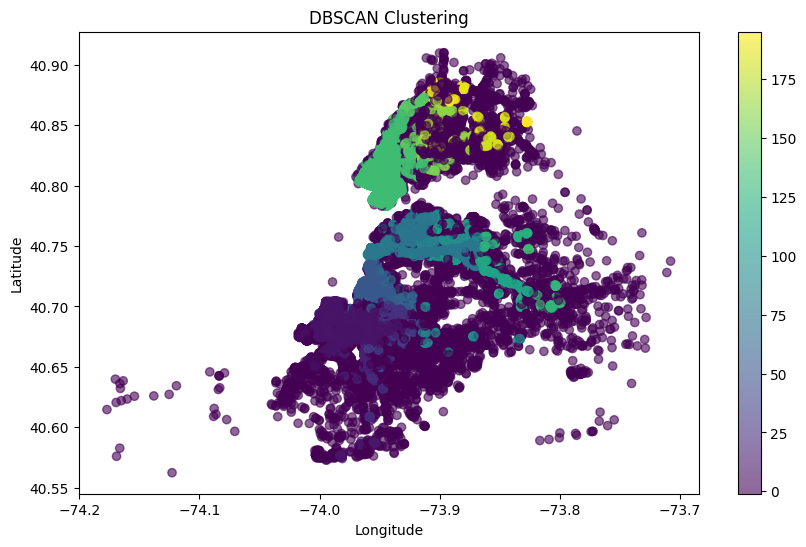

In [ ]:
stratified_sample, coords = sample_and_cluster(sampled_data[0], eps_km, min_samples)
sil_score = calculate_silhouette(coords, stratified_sample['cluster'])
silhouette_scores.append(sil_score)
visualize_clusters(stratified_sample)

Number of clusters formed: 238


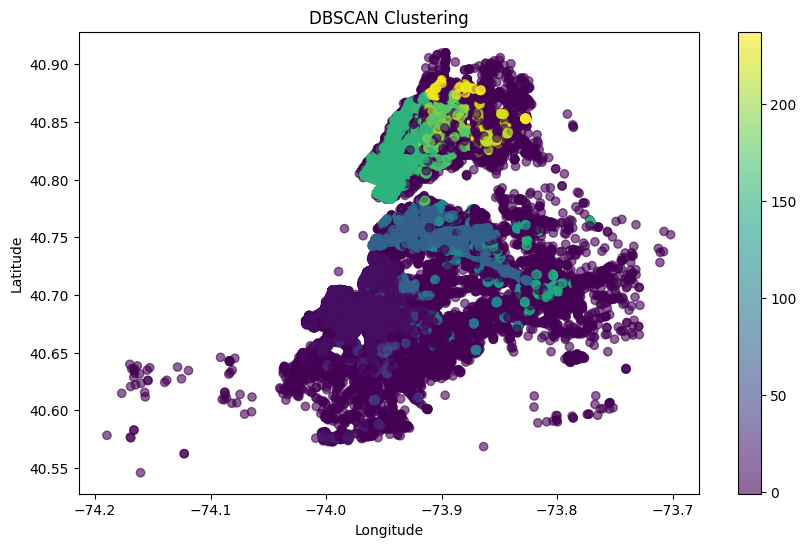

In [ ]:
stratified_sample, coords = sample_and_cluster(sampled_data[1], eps_km, min_samples)
sil_score = calculate_silhouette(coords, stratified_sample['cluster'])
silhouette_scores.append(sil_score)
visualize_clusters(stratified_sample)

Number of clusters formed: 254


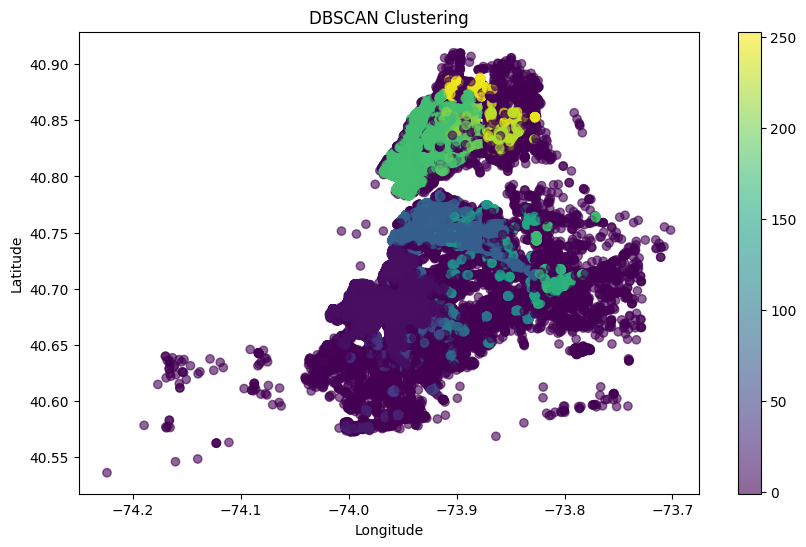

In [ ]:
stratified_sample, coords = sample_and_cluster(sampled_data[2], eps_km, min_samples)
sil_score = calculate_silhouette(coords, stratified_sample['cluster'])
silhouette_scores.append(sil_score)
visualize_clusters(stratified_sample)

In [ ]:
silhouette_scores

[-0.14598672242260569, -0.4096988857420268, -0.3422326137496458]

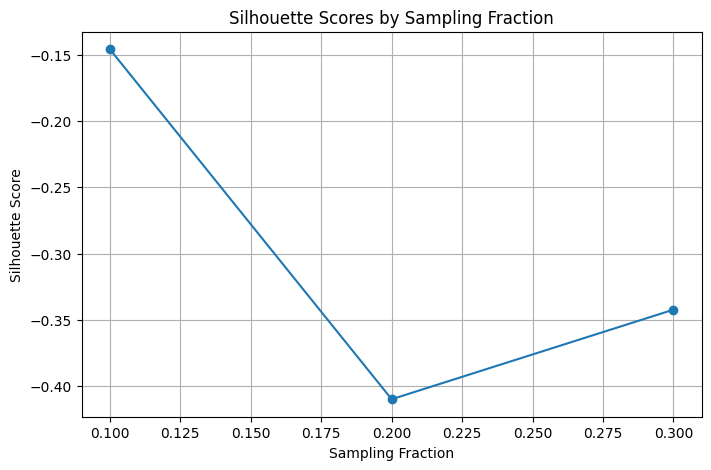

In [ ]:
# Plotting silhouette scores against sampling fractions
plt.figure(figsize=(8, 5))
plt.plot(sampling_fractions, silhouette_scores, marker='o', linestyle='-')
plt.title('Silhouette Scores by Sampling Fraction')
plt.xlabel('Sampling Fraction')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()

## Task 2

In [ ]:
def calculate_metrics(original_averages, sample_averages):
    original_averages = original_averages.reindex(sample_averages.index, fill_value=np.nan)
    sample_averages = sample_averages.reindex(original_averages.index, fill_value=np.nan)
    valid_mask = ~original_averages.isna() & ~sample_averages.isna()
    rmse = np.sqrt(mean_squared_error(original_averages[valid_mask], sample_averages[valid_mask]))
    mape = np.mean(np.abs((original_averages[valid_mask] - sample_averages[valid_mask]) / original_averages[valid_mask])) * 100
    return rmse, mape

In [ ]:
def analyze_neighborhoods(original_averages, sample_averages, N):
    top_n_sample = sample_averages.sort_values(ascending=False).head(N)
    top_n_original = original_averages.sort_values(ascending=False).head(N)
    correlation = top_n_sample.corr(top_n_original, method='pearson')
    prob_data = top_n_sample / top_n_sample.sum()
    prob_original = top_n_original / top_n_original.sum()
    js_divergence = jensenshannon(prob_data, prob_original)
    return top_n_sample, top_n_original, correlation, js_divergence

In [ ]:
original_averages = data.groupby('geohash')['Trip_distance'].mean()

cnt = 0.1
for sample_data in sampled_data:
    sample_averages = sample_data.groupby('geohash')['Trip_distance'].mean()
    rmse, mape = calculate_metrics(original_averages, sample_averages)
    top_n_sample, top_n_original, correlation, js_divergence = analyze_neighborhoods(original_averages, sample_averages, 5)

    print(f"\tFraction Size: {cnt:.2f}\n")
    print(f"RMSE: {rmse}")
    print(f"MAPE: {mape}")
    print(f"Top 5 neighborhoods based on trip_distance concentrations in the sample: {top_n_sample}\n")
    print(f"Top 5 neighborhoods based on trip_distance concentrations in the original data: {top_n_original}")
    print(f"Pearson Correlation: {correlation}")
    print(f"Jensen Shannon Divergence: {js_divergence}\n\n")
    cnt = cnt + 0.1

	Fraction Size: 0.10

RMSE: 3.248539928096216
MAPE: 40.97601483968385
Top 5 neighborhoods based on trip_distance concentrations in the sample: geohash
hfuvx    25.70
hfvh2    18.71
hfuf7    13.46
hfuvp    12.58
hfugu    12.56
Name: Trip_distance, dtype: float64

Top 5 neighborhoods based on trip_distance concentrations in the original data: geohash
hfsks    124.24
hfvpg     46.29
hfuft     45.65
hfvjw     43.80
hfsyd     33.83
Name: Trip_distance, dtype: float64
Pearson Correlation: nan
Jensen Shannon Divergence: 0.09321304258582702


	Fraction Size: 0.20

RMSE: 6.701647804915863
MAPE: 48.5208727891718
Top 5 neighborhoods based on trip_distance concentrations in the sample: geohash
hfsy4    60.66
hfufq    45.17
hfvp8    32.50
hfv4f    28.40
hfuvx    25.70
Name: Trip_distance, dtype: float64

Top 5 neighborhoods based on trip_distance concentrations in the original data: geohash
hfsks    124.24
hfvpg     46.29
hfuft     45.65
hfvjw     43.80
hfsyd     33.83
Name: Trip_distance, dtype: f

### QoS

In [ ]:
# Measuring the execution times for computing average trip_distance per geohash on the full dataset and the stratified sample
start_time_full = time.time()
avg_trip_distance_full = data.groupby('geohash')['trip_distance'].mean()
end_time_full = time.time()

start_time_sample = time.time()
avg_trip_distance_sample = stratified_sample.groupby('geohash')['trip_distance'].mean()
end_time_sample = time.time()

execution_time_full = end_time_full - start_time_full
execution_time_sample = end_time_sample - start_time_sample

# Plotting execution times
sizes = [len(data), len(stratified_sample)]
times = [execution_time_full, execution_time_sample]

plt.figure(figsize=(10, 5))
plt.plot(sizes, times, marker='o')
plt.title('Query Execution Time vs. Data Size')
plt.xlabel('Data Size')
plt.ylabel('Execution Time (seconds)')
plt.grid(True)
plt.show()